In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning, message=".*use_inf_as_na.*")
import numpy as np
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [2]:
df= pd.read_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/ncr_ride_bookings.csv")
df

,Date,Time,Booking ID,Booking Status,Customer ID,Vehicle Type,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,...,Reason for cancelling by Customer,Cancelled Rides by Driver,Driver Cancellation Reason,Incomplete Rides,Incomplete Rides Reason,Booking Value,Ride Distance,Driver Ratings,Customer Rating,Payment Method
0,2024-03-23,12:29:38,"""CNR5884300""",No Driver Found,"""CID1982111""",eBike,Palam Vihar,Jhilmil,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2024-11-29,18:01:39,"""CNR1326809""",Incomplete,"""CID4604802""",Go Sedan,Shastri Nagar,Gurgaon Sector 56,4.9,14.0,...,NaN,NaN,NaN,1.0,Vehicle Breakdown,237.0,5.73,NaN,NaN,UPI
2,2024-08-23,08:56:10,"""CNR8494506""",Completed,"""CID9202816""",Auto,Khandsa,Malviya Nagar,13.4,25.8,...,NaN,NaN,NaN,NaN,NaN,627.0,13.58,4.9,4.9,Debit Card
3,2024-10-21,17:17:25,"""CNR8906825""",Completed,"""CID2610914""",Premier Sedan,Central Secretariat,Inderlok,13.1,28.5,...,NaN,NaN,NaN,NaN,NaN,416.0,34.02,4.6,5.0,UPI
4,2024-09-16,22:08:00,"""CNR1950162""",Completed,"""CID9933542""",Bike,Ghitorni Village,Khan Market,5.3,19.6,...,NaN,NaN,NaN,NaN,NaN,737.0,48.21,4.1,4.3,UPI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,2024-11-11,19:34:01,"""CNR6500631""",Completed,"""CID4337371""",Go Mini,MG Road,Ghitorni,10.2,44.4,...,NaN,NaN,NaN,NaN,NaN,475.0,40.08,3.7,4.1,Uber Wallet
149996,2024-11-24,15:55:09,"""CNR2468611""",Completed,"""CID2325623""",Go Mini,Golf Course Road,Akshardham,5.1,30.8,...,NaN,NaN,NaN,NaN,NaN,1093.0,21.31,4.8,5.0,UPI
149997,2024-09-18,10:55:15,"""CNR6358306""",Completed,"""CID9925486""",Go Sedan,Satguru Ram Singh Marg,Jor Bagh,2.7,23.4,...,NaN,NaN,NaN,NaN,NaN,852.0,15.93,3.9,4.4,Cash
149998,2024-10-05,07:53:34,"""CNR3030099""",Completed,"""CID9415487""",Auto,Ghaziabad,Saidulajab,6.9,39.6,...,NaN,NaN,NaN,NaN,NaN,333.0,45.54,4.1,3.7,UPI


In [3]:
df.shape

(150000, 21)

In [4]:
df.duplicated().sum()

np.int64(0)

### Handle null values

In [5]:
df.isnull().sum()

Date                                      0
Time                                      0
Booking ID                                0
Booking Status                            0
Customer ID                               0
Vehicle Type                              0
Pickup Location                           0
Drop Location                             0
Avg VTAT                              10500
Avg CTAT                              48000
Cancelled Rides by Customer          139500
Reason for cancelling by Customer    139500
Cancelled Rides by Driver            123000
Driver Cancellation Reason           123000
Incomplete Rides                     141000
Incomplete Rides Reason              141000
Booking Value                         48000
Ride Distance                         48000
Driver Ratings                        57000
Customer Rating                       57000
Payment Method                        48000
dtype: int64

In [480]:
df.columns[df.isnull().any()]

Index(['Avg VTAT', 'Avg CTAT', 'Cancelled Rides by Customer',
       'Reason for cancelling by Customer', 'Cancelled Rides by Driver',
       'Driver Cancellation Reason', 'Incomplete Rides',
       'Incomplete Rides Reason', 'Booking Value', 'Ride Distance',
       'Driver Ratings', 'Customer Rating', 'Payment Method'],
      dtype='object')

In [481]:
df[df.isnull().any(axis=1)]

,Date,Time,Booking ID,Booking Status,Customer ID,Vehicle Type,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,...,Reason for cancelling by Customer,Cancelled Rides by Driver,Driver Cancellation Reason,Incomplete Rides,Incomplete Rides Reason,Booking Value,Ride Distance,Driver Ratings,Customer Rating,Payment Method
0,2024-03-23,12:29:38,"""CNR5884300""",No Driver Found,"""CID1982111""",eBike,Palam Vihar,Jhilmil,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2024-11-29,18:01:39,"""CNR1326809""",Incomplete,"""CID4604802""",Go Sedan,Shastri Nagar,Gurgaon Sector 56,4.9,14.0,...,NaN,NaN,NaN,1.0,Vehicle Breakdown,237.0,5.73,NaN,NaN,UPI
2,2024-08-23,08:56:10,"""CNR8494506""",Completed,"""CID9202816""",Auto,Khandsa,Malviya Nagar,13.4,25.8,...,NaN,NaN,NaN,NaN,NaN,627.0,13.58,4.9,4.9,Debit Card
3,2024-10-21,17:17:25,"""CNR8906825""",Completed,"""CID2610914""",Premier Sedan,Central Secretariat,Inderlok,13.1,28.5,...,NaN,NaN,NaN,NaN,NaN,416.0,34.02,4.6,5.0,UPI
4,2024-09-16,22:08:00,"""CNR1950162""",Completed,"""CID9933542""",Bike,Ghitorni Village,Khan Market,5.3,19.6,...,NaN,NaN,NaN,NaN,NaN,737.0,48.21,4.1,4.3,UPI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,2024-11-11,19:34:01,"""CNR6500631""",Completed,"""CID4337371""",Go Mini,MG Road,Ghitorni,10.2,44.4,...,NaN,NaN,NaN,NaN,NaN,475.0,40.08,3.7,4.1,Uber Wallet
149996,2024-11-24,15:55:09,"""CNR2468611""",Completed,"""CID2325623""",Go Mini,Golf Course Road,Akshardham,5.1,30.8,...,NaN,NaN,NaN,NaN,NaN,1093.0,21.31,4.8,5.0,UPI
149997,2024-09-18,10:55:15,"""CNR6358306""",Completed,"""CID9925486""",Go Sedan,Satguru Ram Singh Marg,Jor Bagh,2.7,23.4,...,NaN,NaN,NaN,NaN,NaN,852.0,15.93,3.9,4.4,Cash
149998,2024-10-05,07:53:34,"""CNR3030099""",Completed,"""CID9415487""",Auto,Ghaziabad,Saidulajab,6.9,39.6,...,NaN,NaN,NaN,NaN,NaN,333.0,45.54,4.1,3.7,UPI


In [482]:
for col in df.columns:
    print(f"{col}: {df[col].nunique()} unique values")
    # print(df[col].value_counts())

Date: 365 unique values
Time: 62910 unique values
Booking ID: 148767 unique values
Booking Status: 5 unique values
Customer ID: 148788 unique values
Vehicle Type: 7 unique values
Pickup Location: 176 unique values
Drop Location: 176 unique values
Avg VTAT: 181 unique values
Avg CTAT: 351 unique values
Cancelled Rides by Customer: 1 unique values
Reason for cancelling by Customer: 5 unique values
Cancelled Rides by Driver: 1 unique values
Driver Cancellation Reason: 4 unique values
Incomplete Rides: 1 unique values
Incomplete Rides Reason: 3 unique values
Booking Value: 2566 unique values
Ride Distance: 4901 unique values
Driver Ratings: 21 unique values
Customer Rating: 21 unique values
Payment Method: 5 unique values


In [483]:
df["Booking Status"].unique()

array(['No Driver Found', 'Incomplete', 'Completed',
       'Cancelled by Driver', 'Cancelled by Customer'], dtype=object)

Completed rides ควรจะมีค่า fare, distance, ratings ครบ แต่ถ้าหายไป = มีปัญหาข้อมูล

In [484]:
is_completed = df[df['Booking Status'] == 'Completed']
required_cols = ['Booking Value', 'Ride Distance', 'Driver Ratings', 'Customer Rating']

print(f"Total Completed Rides: {len(is_completed)}")


for col in required_cols:
    missing = is_completed[col].isna().sum()
    pct = (missing / len(is_completed)) * 100
    print(f"  {col}: {missing} ({pct:.2f}%)")

problematic = is_completed[is_completed[required_cols].isna().any(axis=1)]

if len(problematic) > 0:
    print(f"\nFound {len(problematic)} completed rides with missing data:")
    print(problematic[['Booking ID', 'Date', 'Time'] + required_cols].head())
else:
    print("\n✓ All completed rides have complete data!")

Total Completed Rides: 93000
  Booking Value: 0 (0.00%)
  Ride Distance: 0 (0.00%)
  Driver Ratings: 0 (0.00%)
  Customer Rating: 0 (0.00%)

✓ All completed rides have complete data!


summary: don't need KNN computation

In [485]:
# def create_missing_indicators(df: pd.DataFrame) -> pd.DataFrame:
#     missing_flags = {
#         'missing_vtat': 'Avg VTAT',
#         'missing_ctat': 'Avg CTAT',
#         'missing_ratings': 'Driver Ratings',
#         'missing_fare': 'Booking Value'
#     }
    
#     for flag_name, column in missing_flags.items():
#         df[flag_name] = df[column].isna().astype(int)
    
#     return df

In [6]:
def extract_hour_feature(df: pd.DataFrame) -> pd.DataFrame:
    if 'hour' not in df.columns:
        df['hour'] = pd.to_datetime(df['Time']).dt.hour
    return df


In [7]:
def _impute_by_groups(df: pd.DataFrame, column: str, group_cols: list) -> pd.DataFrame:
    group_medians = df.groupby(group_cols)[column].median()
    global_median = df[column].median()
    
    missing_mask = df[column].isna()
    
    for idx in df[missing_mask].index:
        group_key = tuple(df.loc[idx, col] for col in group_cols)
        
        if group_key in group_medians.index:
            df.loc[idx, column] = group_medians[group_key]
        else:
            df.loc[idx, column] = global_median
    
    return df

In [8]:
def impute_wait_times(df: pd.DataFrame) -> pd.DataFrame:
    """
    Impute missing wait time features (VTAT and CTAT).
    
    Strategy:
    - No Driver Found → 0 (no driver was ever assigned)
    - Others → Median by vehicle type and hour
    """
    df = extract_hour_feature(df)
    
    no_driver_status = df['Booking Status'] == 'No Driver Found'
    df.loc[no_driver_status, ['Avg VTAT', 'Avg CTAT']] = 0
    
    for col in ['Avg VTAT', 'Avg CTAT']:
        if df[col].isna().sum() > 0:
            df = _impute_by_groups(df, col, ['Vehicle Type', 'hour'])
    
    return df

In [9]:
def impute_ride_metrics(df: pd.DataFrame) -> pd.DataFrame:
    """
    Impute ride metrics: Value, Distance, and Ratings.
    
    Strategy: Non-completed rides → 0 (ride never happened)
    """
    completed_status = df['Booking Status'] == 'Completed'
    non_completed_status = ~completed_status

    metric_columns = ['Booking Value', 'Ride Distance', 'Driver Ratings', 'Customer Rating']
    
    # Non-completed rides: Fill with 0
    df.loc[non_completed_status, metric_columns] = (
        df.loc[non_completed_status, metric_columns].fillna(0)
    )

    # no need KNN since completed rides have no missing!

    return df

In [10]:
def impute_cancellation_features(df: pd.DataFrame) -> pd.DataFrame:
    numeric_cancellation_cols = [
        'Cancelled Rides by Customer',
        'Cancelled Rides by Driver',
        'Incomplete Rides'
    ]
    
    for col in numeric_cancellation_cols:
        df[col] = df[col].fillna(0)
    
    reason_cols = {
        'Reason for cancelling by Customer': 'Not Applicable',
        'Driver Cancellation Reason': 'Not Applicable',
        'Incomplete Rides Reason': 'Not Applicable'
    }
    
    for col, fill_value in reason_cols.items():
        df[col] = df[col].fillna(fill_value)
    
    return df

In [11]:
def impute_payment_method(df: pd.DataFrame) -> pd.DataFrame:
    """
    Impute payment method.
    
    Strategy:
    - Non-completed rides → "No Payment"
    - Completed rides → Mode (most common payment method)
    """
    completed_mask = df['Booking Status'] == 'Completed'
    non_completed_mask = ~completed_mask
    
    df.loc[non_completed_mask, 'Payment Method'] = (
        df.loc[non_completed_mask, 'Payment Method'].fillna('No Payment')
    )
    
    if df.loc[completed_mask, 'Payment Method'].isna().sum() > 0:
        mode_payment = df.loc[completed_mask, 'Payment Method'].mode()[0]
        df.loc[completed_mask, 'Payment Method'] = (
            df.loc[completed_mask, 'Payment Method'].fillna(mode_payment)
        )
    
    return df

In [12]:
def verify_no_critical_missing(df: pd.DataFrame) -> None:
    critical_features = ['Booking Status', 'Vehicle Type', 'Pickup Location', 'Drop Location']
    
    missing_count = df[critical_features].isna().sum().sum()
    
    if missing_count > 0:
        raise ValueError("Critical features have missing values.")

In [13]:
df = df.copy()

In [14]:
# df = create_missing_indicators(df)
df = extract_hour_feature(df)
df = impute_wait_times(df)
df = impute_ride_metrics(df)
df = impute_cancellation_features(df)
df = impute_payment_method(df)
verify_no_critical_missing(df)

/tmp/ipykernel_1199480/3290335578.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['hour'] = pd.to_datetime(df['Time']).dt.hour


In [15]:
df.isnull().sum()

Date                                 0
Time                                 0
Booking ID                           0
Booking Status                       0
Customer ID                          0
Vehicle Type                         0
Pickup Location                      0
Drop Location                        0
Avg VTAT                             0
Avg CTAT                             0
Cancelled Rides by Customer          0
Reason for cancelling by Customer    0
Cancelled Rides by Driver            0
Driver Cancellation Reason           0
Incomplete Rides                     0
Incomplete Rides Reason              0
Booking Value                        0
Ride Distance                        0
Driver Ratings                       0
Customer Rating                      0
Payment Method                       0
hour                                 0
dtype: int64

In [496]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Date                               150000 non-null  object 
 1   Time                               150000 non-null  object 
 2   Booking ID                         150000 non-null  object 
 3   Booking Status                     150000 non-null  object 
 4   Customer ID                        150000 non-null  object 
 5   Vehicle Type                       150000 non-null  object 
 6   Pickup Location                    150000 non-null  object 
 7   Drop Location                      150000 non-null  object 
 8   Avg VTAT                           150000 non-null  float64
 9   Avg CTAT                           150000 non-null  float64
 10  Cancelled Rides by Customer        150000 non-null  float64
 11  Reason for cancelling by Customer  1500

In [497]:
df.to_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/only_nan_handle.csv", index=False)

### Outlier handling

In [16]:
from scipy import stats


def detect_outliers_iqr(df: pd.DataFrame, column: str, multiplier: float = 1.5) -> pd.Series:
    """
    ตรวจจับ outliers ด้วย IQR method (Interquartile Range).
    
    Args:
        column: ชื่อคอลัมน์
        multiplier: ค่าคูณ IQR (1.5 = ปกติ, 3.0 = extreme outliers)
        
    Returns:
        Boolean Series ที่บอกว่าแถวไหนเป็น outlier
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    
    is_outlier = (df[column] < lower_bound) | (df[column] > upper_bound)
    
    print(f"\n{column}:")
    print(f"  Lower bound: {lower_bound:.2f}")
    print(f"  Upper bound: {upper_bound:.2f}")
    print(f"  Outliers found: {is_outlier.sum()} ({is_outlier.sum()/len(df)*100:.1f}%)")
    
    return is_outlier

In [17]:
def detect_outliers_zscore(df: pd.DataFrame, column: str, threshold: float = 3.0) -> pd.Series:
    """
    ตรวจจับ outliers ด้วย Z-score method.
    
    Args:
        column: ชื่อคอลัมน์
        threshold: ค่าที่ถือว่าเป็น outlier (3 = 99.7% ของข้อมูล)
        
    Returns:
        Boolean Series ที่บอกว่าแถวไหนเป็น outlier
    """
    z_scores = np.abs(stats.zscore(df[column]))
    is_outlier = z_scores > threshold
    
    print(f"\n{column}:")
    print(f"  Z-score threshold: {threshold}")
    print(f"  Outliers found: {is_outlier.sum()} ({is_outlier.sum()/len(df)*100:.1f}%)")
    
    return is_outlier

In [18]:
def handle_outliers_stats(df: pd.DataFrame, method: str = 'iqr') -> pd.DataFrame:

    df = df.copy()
    
    print(f"\n=== Statistical Outlier Detection ({method.upper()}) ===")
    
    # คอลัมน์ที่ต้องตรวจ (เฉพาะตัวเลข และ completed rides)
    completed_mask = df['Booking Status'] == 'Completed'
    numeric_cols = ['Avg VTAT', 'Avg CTAT', 'Booking Value', 'Ride Distance', 
                    'Driver Ratings', 'Customer Rating']
    
    overall_outlier_mask = pd.Series(False, index=df.index)
    
    for col in numeric_cols:
        if col in ['Booking Value', 'Ride Distance', 'Driver Ratings', 'Customer Rating']:
            # ตรวจเฉพาะ completed rides
            data_to_check = df.loc[completed_mask, col]
            
            if method == 'iqr':
                col_outliers = detect_outliers_iqr(df.loc[completed_mask], col, multiplier=1.5)
            else:
                col_outliers = detect_outliers_zscore(df.loc[completed_mask], col, threshold=3.0)
            
            # Cap outliers แทนการลบ
            if col_outliers.sum() > 0:
                upper_bound = df.loc[completed_mask, col].quantile(0.99)
                lower_bound = df.loc[completed_mask, col].quantile(0.01)
                
                df.loc[completed_mask & (df[col] > upper_bound), col] = upper_bound
                df.loc[completed_mask & (df[col] < lower_bound), col] = lower_bound
                
                overall_outlier_mask.loc[completed_mask] |= col_outliers
        else:
            # Wait times - ตรวจทั้งหมด
            if method == 'iqr':
                col_outliers = detect_outliers_iqr(df, col, multiplier=1.5)
            else:
                col_outliers = detect_outliers_zscore(df, col, threshold=3.0)
            
            if col_outliers.sum() > 0:
                upper_bound = df[col].quantile(0.99)
                df.loc[df[col] > upper_bound, col] = upper_bound
                
                overall_outlier_mask |= col_outliers
    
    df['had_outlier'] = overall_outlier_mask.astype(int)
    
    print(f"\n=== Total rows with outliers: {overall_outlier_mask.sum()} ===")
    
    return df

In [501]:
df["Avg VTAT"].unique()

array([ 0. ,  4.9, 13.4, 13.1,  5.3,  5.1,  7.1, 12.1,  6.1,  7.7,  4.6,
       12.2, 14. ,  8.5,  5.6,  6. , 12.4, 10.3,  7. , 10.4,  7.9, 13.6,
       11.5,  3.1,  8.9,  9.2,  2. ,  5.4, 14.6,  6.7,  6.6, 10. , 11. ,
        8. , 12.8,  6.4, 11.3,  2.3,  7.8,  8.8,  9.9,  4.1, 11.2,  3. ,
        9.1,  4.3, 11.4,  6.3, 11.7, 16.6,  5.8,  4. ,  3.4, 11.1,  5.9,
        8.1,  5. , 12. ,  3.2,  9.6,  3.9,  8.4, 10.9,  5.7,  8.6,  9.5,
        2.6,  2.1, 14.4,  7.5, 10.8, 14.7,  3.5,  8.3, 11.9, 12.5, 13.3,
        9.7,  3.6,  9.4,  9. ,  2.4, 19.1,  2.9, 18.5, 16.1, 13.7,  4.5,
        6.9,  6.2,  7.2,  3.7, 11.6,  3.3,  4.7,  7.4,  9.3,  8.2, 13.5,
        4.4,  2.7,  7.3, 10.5,  6.8, 10.7, 12.3,  3.8, 10.2,  9.8,  8.7,
       14.2,  6.5, 12.9,  4.2,  5.2, 16.9,  7.6, 14.9, 11.8, 14.3, 10.1,
       12.6, 14.8, 13.2, 14.5,  4.8, 14.1,  2.5, 15. , 16.2, 12.7,  5.5,
        2.8, 19.2, 18. , 13.9, 13. , 10.6, 20. , 17.6, 15.7,  2.2, 16.5,
       15.9, 19.6, 19.9, 19.8, 16. , 16.4, 13.8, 18

In [502]:
df["Avg CTAT"].unique()


array([ 0.  , 14.  , 25.8 , 28.5 , 19.6 , 18.1 , 20.4 , 16.5 , 26.  ,
       18.9 , 26.4 , 28.2 , 30.9 , 36.9 , 27.5 , 26.1 , 27.  , 27.8 ,
       33.7 , 21.3 , 25.1 , 41.1 , 25.2 , 20.7 , 26.9 , 31.1 , 27.05,
       41.  , 20.5 , 19.4 , 26.6 , 25.4 , 30.  , 35.8 , 18.7 , 10.5 ,
       27.25, 42.3 , 28.4 , 27.4 , 29.7 , 42.2 , 21.6 , 40.7 , 35.4 ,
       27.2 , 23.2 , 42.1 , 28.  , 21.5 , 33.  , 10.1 , 24.3 , 44.5 ,
       27.1 , 38.5 , 17.2 , 37.3 , 26.7 , 34.7 , 28.05, 39.1 , 23.  ,
       31.3 , 43.7 , 28.1 , 35.  , 15.6 , 43.6 , 18.  , 32.7 , 24.6 ,
       38.9 , 16.4 , 36.2 , 35.5 , 41.7 , 38.  , 40.  , 37.  , 40.4 ,
       28.7 , 30.6 , 21.1 , 18.8 , 30.4 , 15.9 , 21.9 , 26.8 , 25.  ,
       44.4 , 16.7 , 26.3 , 15.8 , 31.5 , 30.7 , 23.6 , 24.2 , 17.9 ,
       15.5 , 25.3 , 37.4 , 22.8 , 28.9 , 44.7 , 24.8 , 32.6 , 24.4 ,
       39.3 , 32.5 , 43.1 , 26.5 , 17.  , 20.6 , 37.7 , 28.6 , 40.2 ,
       31.6 , 33.5 , 32.9 , 17.7 , 27.9 , 39.  , 18.4 , 41.8 , 22.  ,
       10.3 , 15.7 ,

In [503]:
def visualize_outliers(df: pd.DataFrame, column: str):
    completed_mask = df['Booking Status'] == 'Completed'
    data = df.loc[completed_mask, column]
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Boxplot
    sns.boxplot(y=data, ax=axes[0])
    axes[0].set_title(f'{column} - Boxplot')
    axes[0].set_ylabel('Value')
    
    # Histogram
    axes[1].hist(data, bins=50, edgecolor='black')
    axes[1].set_title(f'{column} - Distribution')
    axes[1].set_xlabel('Value')
    axes[1].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()


In [19]:
df_no_outliers = handle_outliers_stats(df, method='iqr')
    
# visualize_outliers(df_no_outliers, 'Booking Value')
# visualize_outliers(df_no_outliers, 'Ride Distance')
    


=== Statistical Outlier Detection (IQR) ===

Avg VTAT:
  Lower bound: -4.75
  Upper bound: 20.45
  Outliers found: 0 (0.0%)

Avg CTAT:
  Lower bound: 5.65
  Upper bound: 49.25
  Outliers found: 10500 (7.0%)

Booking Value:
  Lower bound: -448.50
  Upper bound: 1371.50
  Outliers found: 3127 (3.4%)

Ride Distance:
  Lower bound: -21.66
  Upper bound: 73.71
  Outliers found: 0 (0.0%)

Driver Ratings:
  Lower bound: 3.35
  Upper bound: 5.35
  Outliers found: 5203 (5.6%)

Customer Rating:
  Lower bound: 3.30
  Upper bound: 5.70
  Outliers found: 3257 (3.5%)

=== Total rows with outliers: 21653 ===


Booking Value (ค่าโดยสาร)Boxplot:

มี outliers สูงมากที่ ~2000 บาท (จุดสีดำด้านบน)
IQR อยู่ที่ประมาณ 250-650 บาท
Median อยู่ที่ประมาณ 400 บาท

กระจุกตัวที่ 0-500 บาท (ปกติ)
มีหางยาวด้านขวา (right-skewed)
มีแถบสูงที่ ~2000 บาท = outliers หรือ ค่าโดยสารสูงสุดที่ระบบกำหนด (price cap)

Ride Distance (ระยะทาง)
Boxplot:

ไม่มี outliers ชัดเจน
กระจายตัวสม่ำเสมอ 0-50 km

Distribution:

กระจายแบบ uniform distribution (ความถี่เท่ากันทุกช่วง)
นี่ผิดปกติสำหรับข้อมูลจริง! ข้อมูลจริงควรเป็น right-skewed (เดินทางสั้นมาก เดินทางไกลน้อย)

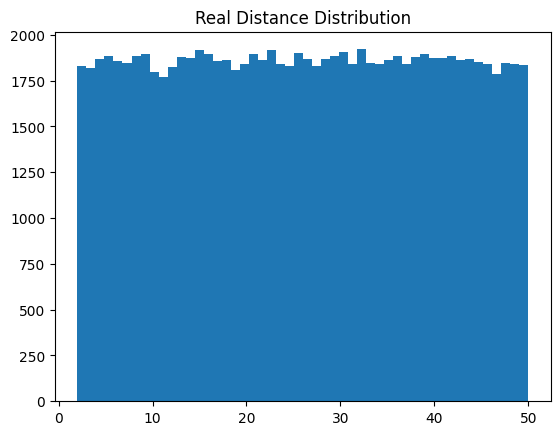

In [505]:
import matplotlib.pyplot as plt

# ดู distribution ของ completed rides
completed = df[df['Booking Status'] == 'Completed']
plt.hist(completed['Ride Distance'], bins=50)
plt.title('Real Distance Distribution')
plt.show()

In [506]:
# Check และ handle outliers
completed = df[df['Booking Status'] == 'Completed']

# Booking Value
print("Booking Value stats:")
print(f"  99th percentile: {completed['Booking Value'].quantile(0.99):.2f}")
print(f"  Max: {completed['Booking Value'].max():.2f}")
print(f"  Count at max: {(completed['Booking Value'] == completed['Booking Value'].max()).sum()}")

Booking Value stats:
  99th percentile: 1963.01
  Max: 4277.00
  Count at max: 1


ก่อน cap: [100, 200, 5000]
upper_bound = 300
หลัง cap: [100, 200, 300]  ← 5000 ถูกแทนที่ด้วย 300

In [507]:
df_no_outliers

,Date,Time,Booking ID,Booking Status,Customer ID,Vehicle Type,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,...,Driver Cancellation Reason,Incomplete Rides,Incomplete Rides Reason,Booking Value,Ride Distance,Driver Ratings,Customer Rating,Payment Method,hour,had_outlier
0,2024-03-23,12:29:38,"""CNR5884300""",No Driver Found,"""CID1982111""",eBike,Palam Vihar,Jhilmil,0.0,0.0,...,Not Applicable,0.0,Not Applicable,0.0,0.00,0.0,0.0,No Payment,12,1
1,2024-11-29,18:01:39,"""CNR1326809""",Incomplete,"""CID4604802""",Go Sedan,Shastri Nagar,Gurgaon Sector 56,4.9,14.0,...,Not Applicable,1.0,Vehicle Breakdown,237.0,5.73,0.0,0.0,UPI,18,0
2,2024-08-23,08:56:10,"""CNR8494506""",Completed,"""CID9202816""",Auto,Khandsa,Malviya Nagar,13.4,25.8,...,Not Applicable,0.0,Not Applicable,627.0,13.58,4.9,4.9,Debit Card,8,0
3,2024-10-21,17:17:25,"""CNR8906825""",Completed,"""CID2610914""",Premier Sedan,Central Secretariat,Inderlok,13.1,28.5,...,Not Applicable,0.0,Not Applicable,416.0,34.02,4.6,5.0,UPI,17,0
4,2024-09-16,22:08:00,"""CNR1950162""",Completed,"""CID9933542""",Bike,Ghitorni Village,Khan Market,5.3,19.6,...,Not Applicable,0.0,Not Applicable,737.0,48.21,4.1,4.3,UPI,22,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,2024-11-11,19:34:01,"""CNR6500631""",Completed,"""CID4337371""",Go Mini,MG Road,Ghitorni,10.2,44.4,...,Not Applicable,0.0,Not Applicable,475.0,40.08,3.7,4.1,Uber Wallet,19,0
149996,2024-11-24,15:55:09,"""CNR2468611""",Completed,"""CID2325623""",Go Mini,Golf Course Road,Akshardham,5.1,30.8,...,Not Applicable,0.0,Not Applicable,1093.0,21.31,4.8,5.0,UPI,15,0
149997,2024-09-18,10:55:15,"""CNR6358306""",Completed,"""CID9925486""",Go Sedan,Satguru Ram Singh Marg,Jor Bagh,2.7,23.4,...,Not Applicable,0.0,Not Applicable,852.0,15.93,3.9,4.4,Cash,10,0
149998,2024-10-05,07:53:34,"""CNR3030099""",Completed,"""CID9415487""",Auto,Ghaziabad,Saidulajab,6.9,39.6,...,Not Applicable,0.0,Not Applicable,333.0,45.54,4.1,3.7,UPI,7,0


In [508]:
df_no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Date                               150000 non-null  object 
 1   Time                               150000 non-null  object 
 2   Booking ID                         150000 non-null  object 
 3   Booking Status                     150000 non-null  object 
 4   Customer ID                        150000 non-null  object 
 5   Vehicle Type                       150000 non-null  object 
 6   Pickup Location                    150000 non-null  object 
 7   Drop Location                      150000 non-null  object 
 8   Avg VTAT                           150000 non-null  float64
 9   Avg CTAT                           150000 non-null  float64
 10  Cancelled Rides by Customer        150000 non-null  float64
 11  Reason for cancelling by Customer  1500

In [20]:
def feature_eng(df):

    df = df.copy()
    
    # Temporal features
    df['datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])
    df['hour'] = df['datetime'].dt.hour
    df['day_of_week'] = df['datetime'].dt.dayofweek
    df['is_weekend'] = (df['day_of_week'] >= 5).astype(int)
    df['month'] = df['datetime'].dt.month
    df['day'] = df['datetime'].dt.day
    
    def get_day_time(hour):
        if 5 <= hour < 12:
            return 'Morning'
        elif 12 <= hour < 17:
            return 'Afternoon'
        elif 17 <= hour < 21:
            return 'Evening'
        else:
            return 'Night'

    df['day_time'] = df['hour'].apply(get_day_time)
    
    # Cyclical encoding
    df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)
    df['dow_sin'] = np.sin(2 * np.pi * df['day_of_week'] / 7)
    df['dow_cos'] = np.cos(2 * np.pi * df['day_of_week'] / 7)
    
    # Rush hour indicators
    df['is_morning_rush'] = df['hour'].isin([9, 10, 11]).astype(int)
    df['is_afternoon_rush'] = df['hour'].isin([15, 16]).astype(int)
    df['is_evening_rush'] = df['hour'].isin([17, 18, 19, 20, 21]).astype(int)
    df['is_late_night'] = df['hour'].isin([0, 1, 2, 3, 4, 5]).astype(int)
    
    # df['total_wait_time'] = df['Avg VTAT'] + df['Avg CTAT']
    # df['wait_time_log'] = np.log1p(df['total_wait_time'])

    # # Wait time × Rush hour
    # df['wait_morning_rush'] = df['total_wait_time'] * df['is_morning_rush']
    # df['wait_evening_rush'] = df['total_wait_time'] * df['is_evening_rush']
    
    # Value metrics (only for completed rides)
    completed_mask = df['Booking Status'] == 'Completed'
    df['price_per_km'] = 0.0
    df.loc[completed_mask, 'price_per_km'] = (
        df.loc[completed_mask, 'Booking Value'] / 
        (df.loc[completed_mask, 'Ride Distance'] + 0.1)
    )
    
    # # Booking outcome indicators
    # df['is_completed'] = (df['Booking Status'] == 'Completed').astype(int)
    # df['is_cancelled'] = df['Booking Status'].isin(['Cancelled by Customer', 'Cancelled by Driver']).astype(int)
    # df['is_no_driver'] = (df['Booking Status'] == 'No Driver Found').astype(int)
    
    # Location popularity (frequency encoding)
    pickup_counts = df['Pickup Location'].value_counts()
    drop_counts = df['Drop Location'].value_counts()
    
    df['pickup_popularity'] = df['Pickup Location'].map(pickup_counts)
    df['drop_popularity'] = df['Drop Location'].map(drop_counts)
    
    # Vehicle type popularity
    vehicle_counts = df['Vehicle Type'].value_counts()
    df['vehicle_popularity'] = df['Vehicle Type'].map(vehicle_counts)
    
    # Price deviation from average (by hour and vehicle type)
    # df['price_vs_hour_avg'] = df.groupby('hour')['Booking Value'].transform(
    #     lambda x: x / (x.mean() + 0.1)
    # )
    
    # df['price_vs_vehicle_avg'] = df.groupby('Vehicle Type')['Booking Value'].transform(
    #     lambda x: x / (x.mean() + 0.1)
    # )
    # hotspot demand (rides from same pickup location in same hour)
    df['pickup_hour_demand'] = df.groupby(['Pickup Location', 'hour']).cumcount()
    
    return df

In [510]:
# %pip install holidays

In [21]:
import holidays

def add_holidays_india(df):
    df = df.copy()

    india_holidays = holidays.India(years=[2024])
    
    # df['date'] = pd.to_datetime(df['Date'])
    df['is_holiday'] = df['Date'].apply(lambda x: x in india_holidays).astype(int)
    
    # # Get holiday name
    # df['holiday_name'] = df['Date'].apply(
    #     lambda x: india_holidays.get(x, 'Not Holiday')
    # )
    
    return df


In [22]:
df = feature_eng(df_no_outliers)
df

,Date,Time,Booking ID,Booking Status,Customer ID,Vehicle Type,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,...,dow_cos,is_morning_rush,is_afternoon_rush,is_evening_rush,is_late_night,price_per_km,pickup_popularity,drop_popularity,vehicle_popularity,pickup_hour_demand
0,2024-03-23,12:29:38,"""CNR5884300""",No Driver Found,"""CID1982111""",eBike,Palam Vihar,Jhilmil,0.0,0.0,...,-0.222521,0,0,0,0,0.000000,818,855,10557,0
1,2024-11-29,18:01:39,"""CNR1326809""",Incomplete,"""CID4604802""",Go Sedan,Shastri Nagar,Gurgaon Sector 56,4.9,14.0,...,-0.900969,0,0,1,0,0.000000,868,894,27141,0
2,2024-08-23,08:56:10,"""CNR8494506""",Completed,"""CID9202816""",Auto,Khandsa,Malviya Nagar,13.4,25.8,...,-0.900969,0,0,0,0,45.833333,949,829,37419,0
3,2024-10-21,17:17:25,"""CNR8906825""",Completed,"""CID2610914""",Premier Sedan,Central Secretariat,Inderlok,13.1,28.5,...,1.000000,0,0,1,0,12.192263,839,835,18111,0
4,2024-09-16,22:08:00,"""CNR1950162""",Completed,"""CID9933542""",Bike,Ghitorni Village,Khan Market,5.3,19.6,...,1.000000,0,0,0,0,15.255641,790,874,22517,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,2024-11-11,19:34:01,"""CNR6500631""",Completed,"""CID4337371""",Go Mini,MG Road,Ghitorni,10.2,44.4,...,1.000000,0,0,1,0,11.821802,820,877,29806,61
149996,2024-11-24,15:55:09,"""CNR2468611""",Completed,"""CID2325623""",Go Mini,Golf Course Road,Akshardham,5.1,30.8,...,0.623490,0,1,0,0,51.050911,818,856,29806,52
149997,2024-09-18,10:55:15,"""CNR6358306""",Completed,"""CID9925486""",Go Sedan,Satguru Ram Singh Marg,Jor Bagh,2.7,23.4,...,-0.222521,1,0,0,0,53.150343,844,831,27141,47
149998,2024-10-05,07:53:34,"""CNR3030099""",Completed,"""CID9415487""",Auto,Ghaziabad,Saidulajab,6.9,39.6,...,-0.222521,0,0,0,0,7.296231,851,844,37419,34


In [23]:
df.isnull().sum()

Date                                 0
Time                                 0
Booking ID                           0
Booking Status                       0
Customer ID                          0
Vehicle Type                         0
Pickup Location                      0
Drop Location                        0
Avg VTAT                             0
Avg CTAT                             0
Cancelled Rides by Customer          0
Reason for cancelling by Customer    0
Cancelled Rides by Driver            0
Driver Cancellation Reason           0
Incomplete Rides                     0
Incomplete Rides Reason              0
Booking Value                        0
Ride Distance                        0
Driver Ratings                       0
Customer Rating                      0
Payment Method                       0
hour                                 0
had_outlier                          0
datetime                             0
day_of_week                          0
is_weekend               

In [24]:
df = add_holidays_india(df)
df

,Date,Time,Booking ID,Booking Status,Customer ID,Vehicle Type,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,...,is_morning_rush,is_afternoon_rush,is_evening_rush,is_late_night,price_per_km,pickup_popularity,drop_popularity,vehicle_popularity,pickup_hour_demand,is_holiday
0,2024-03-23,12:29:38,"""CNR5884300""",No Driver Found,"""CID1982111""",eBike,Palam Vihar,Jhilmil,0.0,0.0,...,0,0,0,0,0.000000,818,855,10557,0,0
1,2024-11-29,18:01:39,"""CNR1326809""",Incomplete,"""CID4604802""",Go Sedan,Shastri Nagar,Gurgaon Sector 56,4.9,14.0,...,0,0,1,0,0.000000,868,894,27141,0,0
2,2024-08-23,08:56:10,"""CNR8494506""",Completed,"""CID9202816""",Auto,Khandsa,Malviya Nagar,13.4,25.8,...,0,0,0,0,45.833333,949,829,37419,0,0
3,2024-10-21,17:17:25,"""CNR8906825""",Completed,"""CID2610914""",Premier Sedan,Central Secretariat,Inderlok,13.1,28.5,...,0,0,1,0,12.192263,839,835,18111,0,0
4,2024-09-16,22:08:00,"""CNR1950162""",Completed,"""CID9933542""",Bike,Ghitorni Village,Khan Market,5.3,19.6,...,0,0,0,0,15.255641,790,874,22517,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,2024-11-11,19:34:01,"""CNR6500631""",Completed,"""CID4337371""",Go Mini,MG Road,Ghitorni,10.2,44.4,...,0,0,1,0,11.821802,820,877,29806,61,0
149996,2024-11-24,15:55:09,"""CNR2468611""",Completed,"""CID2325623""",Go Mini,Golf Course Road,Akshardham,5.1,30.8,...,0,1,0,0,51.050911,818,856,29806,52,0
149997,2024-09-18,10:55:15,"""CNR6358306""",Completed,"""CID9925486""",Go Sedan,Satguru Ram Singh Marg,Jor Bagh,2.7,23.4,...,1,0,0,0,53.150343,844,831,27141,47,0
149998,2024-10-05,07:53:34,"""CNR3030099""",Completed,"""CID9415487""",Auto,Ghaziabad,Saidulajab,6.9,39.6,...,0,0,0,0,7.296231,851,844,37419,34,0


In [ ]:
# df.to_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_no_encode_v3.csv", index=False)

In [25]:
df.columns

Index(['Date', 'Time', 'Booking ID', 'Booking Status', 'Customer ID',
       'Vehicle Type', 'Pickup Location', 'Drop Location', 'Avg VTAT',
       'Avg CTAT', 'Cancelled Rides by Customer',
       'Reason for cancelling by Customer', 'Cancelled Rides by Driver',
       'Driver Cancellation Reason', 'Incomplete Rides',
       'Incomplete Rides Reason', 'Booking Value', 'Ride Distance',
       'Driver Ratings', 'Customer Rating', 'Payment Method', 'hour',
       'had_outlier', 'datetime', 'day_of_week', 'is_weekend', 'month', 'day',
       'day_time', 'hour_sin', 'hour_cos', 'dow_sin', 'dow_cos',
       'is_morning_rush', 'is_afternoon_rush', 'is_evening_rush',
       'is_late_night', 'price_per_km', 'pickup_popularity', 'drop_popularity',
       'vehicle_popularity', 'pickup_hour_demand', 'is_holiday'],
      dtype='object')

In [517]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 41 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   Date                               150000 non-null  object        
 1   Time                               150000 non-null  object        
 2   Booking ID                         150000 non-null  object        
 3   Booking Status                     150000 non-null  object        
 4   Customer ID                        150000 non-null  object        
 5   Vehicle Type                       150000 non-null  object        
 6   Pickup Location                    150000 non-null  object        
 7   Drop Location                      150000 non-null  object        
 8   Avg VTAT                           150000 non-null  float64       
 9   Avg CTAT                           150000 non-null  float64       
 10  Cancelled Rides by C

In [26]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns
cat_cols

Index(['Date', 'Time', 'Booking ID', 'Booking Status', 'Customer ID',
       'Vehicle Type', 'Pickup Location', 'Drop Location',
       'Reason for cancelling by Customer', 'Driver Cancellation Reason',
       'Incomplete Rides Reason', 'Payment Method', 'day_time'],
      dtype='object')

In [519]:
df["Reason for cancelling by Customer"].unique()

array(['Not Applicable', 'Driver is not moving towards pickup location',
       'Driver asked to cancel', 'AC is not working', 'Change of plans',
       'Wrong Address'], dtype=object)

In [520]:
df["Driver Cancellation Reason"].unique()

array(['Not Applicable', 'Personal & Car related issues',
       'Customer related issue', 'More than permitted people in there',
       'The customer was coughing/sick'], dtype=object)

In [521]:
df["Incomplete Rides Reason"].unique()

array(['Not Applicable', 'Vehicle Breakdown', 'Other Issue',
       'Customer Demand'], dtype=object)

In [522]:
df["Pickup Location"].nunique()

176

In [523]:
df["Drop Location"].nunique()

176

In [27]:
from sklearn.preprocessing import OneHotEncoder
def encode_categorical(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    # cols = ['Vehicle Type', 'Payment Method', 
    #         'Reason for cancelling by Customer', 'Driver Cancellation Reason', 
    #         'Incomplete Rides Reason']
    cols = ['Vehicle Type', 'Payment Method', 'day_time']
    onehot = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
    encoded = onehot.fit_transform(df[cols])
#     print(onehot.get_feature_names_out())
    encoded_df = pd.DataFrame(
        encoded, 
        columns=onehot.get_feature_names_out(cols), 
        index=df.index
    )
    
    # Drop the original categorical cols and concat the encoded ones
    df = df.drop(columns=cols).join(encoded_df)
    
    return df

In [28]:
df_enc = encode_categorical(df)
df_enc

,Date,Time,Booking ID,Booking Status,Customer ID,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,Cancelled Rides by Customer,...,Vehicle Type_Uber XL,Vehicle Type_eBike,Payment Method_Credit Card,Payment Method_Debit Card,Payment Method_No Payment,Payment Method_UPI,Payment Method_Uber Wallet,day_time_Evening,day_time_Morning,day_time_Night
0,2024-03-23,12:29:38,"""CNR5884300""",No Driver Found,"""CID1982111""",Palam Vihar,Jhilmil,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2024-11-29,18:01:39,"""CNR1326809""",Incomplete,"""CID4604802""",Shastri Nagar,Gurgaon Sector 56,4.9,14.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,2024-08-23,08:56:10,"""CNR8494506""",Completed,"""CID9202816""",Khandsa,Malviya Nagar,13.4,25.8,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,2024-10-21,17:17:25,"""CNR8906825""",Completed,"""CID2610914""",Central Secretariat,Inderlok,13.1,28.5,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,2024-09-16,22:08:00,"""CNR1950162""",Completed,"""CID9933542""",Ghitorni Village,Khan Market,5.3,19.6,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,2024-11-11,19:34:01,"""CNR6500631""",Completed,"""CID4337371""",MG Road,Ghitorni,10.2,44.4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
149996,2024-11-24,15:55:09,"""CNR2468611""",Completed,"""CID2325623""",Golf Course Road,Akshardham,5.1,30.8,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
149997,2024-09-18,10:55:15,"""CNR6358306""",Completed,"""CID9925486""",Satguru Ram Singh Marg,Jor Bagh,2.7,23.4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
149998,2024-10-05,07:53:34,"""CNR3030099""",Completed,"""CID9415487""",Ghaziabad,Saidulajab,6.9,39.6,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [29]:
df_enc.columns

Index(['Date', 'Time', 'Booking ID', 'Booking Status', 'Customer ID',
       'Pickup Location', 'Drop Location', 'Avg VTAT', 'Avg CTAT',
       'Cancelled Rides by Customer', 'Reason for cancelling by Customer',
       'Cancelled Rides by Driver', 'Driver Cancellation Reason',
       'Incomplete Rides', 'Incomplete Rides Reason', 'Booking Value',
       'Ride Distance', 'Driver Ratings', 'Customer Rating', 'hour',
       'had_outlier', 'datetime', 'day_of_week', 'is_weekend', 'month', 'day',
       'hour_sin', 'hour_cos', 'dow_sin', 'dow_cos', 'is_morning_rush',
       'is_afternoon_rush', 'is_evening_rush', 'is_late_night', 'price_per_km',
       'pickup_popularity', 'drop_popularity', 'vehicle_popularity',
       'pickup_hour_demand', 'is_holiday', 'Vehicle Type_Bike',
       'Vehicle Type_Go Mini', 'Vehicle Type_Go Sedan',
       'Vehicle Type_Premier Sedan', 'Vehicle Type_Uber XL',
       'Vehicle Type_eBike', 'Payment Method_Credit Card',
       'Payment Method_Debit Card', 'Payme

In [30]:
cat_cols = df_enc.select_dtypes(include=['object']).columns
cat_cols

Index(['Date', 'Time', 'Booking ID', 'Booking Status', 'Customer ID',
       'Pickup Location', 'Drop Location', 'Reason for cancelling by Customer',
       'Driver Cancellation Reason', 'Incomplete Rides Reason'],
      dtype='object')

In [528]:
print(df.groupby('Booking Status')[['Avg VTAT', 'Avg CTAT']].mean())

                        Avg VTAT   Avg CTAT
Booking Status                             
Cancelled by Customer  12.512381  27.262976
Cancelled by Driver     7.501952  27.271804
Completed               8.511878  30.030569
Incomplete              6.013744  20.003233
No Driver Found         0.000000   0.000000


In [529]:
# actual or histortical

# เช็ค variance
print(df.groupby('Booking Status')['Avg VTAT'].std())

Booking Status
Cancelled by Customer    4.344423
Cancelled by Driver      2.600695
Completed                3.748138
Incomplete               2.305903
No Driver Found          0.000000
Name: Avg VTAT, dtype: float64


high variance  
Std = 2.3 - 4.3 นาที
แต่ละ booking มี VTAT ต่างกัน → actual values

ถ้าเป็น historical average:
Bookings ใน zone/hour เดียวกันจะได้ค่าเดียวกัน Std ควรต่ำมาก (< 0.5) หรือเป็น 0

In [530]:
# 1. User request ride 
# 2. Wait for driver (VTAT) → รู้ว่ารอนานหรือไม่
# 3. Driver arrives (CTAT)
# 4. Booking outcome → Completed/Cancelled/Incomplete

In [531]:
# df_enc.to_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_encode_v3.csv", index=False)

In [31]:
df["price_per_km"].unique()

array([ 0.        , 45.83333333, 12.1922626 , ..., 53.15034311,
        7.29623138, 37.85814937], shape=(89658,))

In [32]:
df["Booking Value"].unique()

array([   0.,  237.,  627., ..., 1872., 2045., 1987.], shape=(1949,))

### Drop unnecessary columns

In [ ]:
cols_to_drop = ['Date', 'Time', 'Booking ID', "datetime",
                'Customer ID', 'Pickup Location', 'Drop Location',  'Reason for cancelling by Customer', 'Driver Cancellation Reason',  'Incomplete Rides Reason','had_outlier', 'Incomplete Rides', 'Cancelled Rides by Customer', 'Cancelled Rides by Driver',
                'Booking Value', 'Ride Distance','price_per_km']

df_enc = df_enc.drop(columns=cols_to_drop)
df = df.drop(columns=cols_to_drop)


In [ ]:
# df.to_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_no_encode_drop_cols_v8.csv", index=False)

In [34]:
df_enc.to_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_encode_dropcols_v9.csv", index=False)

In [35]:
df_enc

,Booking Status,Avg VTAT,Avg CTAT,Driver Ratings,Customer Rating,hour,day_of_week,is_weekend,month,day,...,Vehicle Type_Uber XL,Vehicle Type_eBike,Payment Method_Credit Card,Payment Method_Debit Card,Payment Method_No Payment,Payment Method_UPI,Payment Method_Uber Wallet,day_time_Evening,day_time_Morning,day_time_Night
0,No Driver Found,0.0,0.0,0.0,0.0,12,5,1,3,23,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,Incomplete,4.9,14.0,0.0,0.0,18,4,0,11,29,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,Completed,13.4,25.8,4.9,4.9,8,4,0,8,23,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,Completed,13.1,28.5,4.6,5.0,17,0,0,10,21,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,Completed,5.3,19.6,4.1,4.3,22,0,0,9,16,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,Completed,10.2,44.4,3.7,4.1,19,0,0,11,11,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
149996,Completed,5.1,30.8,4.8,5.0,15,6,1,11,24,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
149997,Completed,2.7,23.4,3.9,4.4,10,2,0,9,18,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
149998,Completed,6.9,39.6,4.1,3.7,7,5,1,10,5,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [36]:
df_enc.columns

Index(['Booking Status', 'Avg VTAT', 'Avg CTAT', 'Driver Ratings',
       'Customer Rating', 'hour', 'day_of_week', 'is_weekend', 'month', 'day',
       'hour_sin', 'hour_cos', 'dow_sin', 'dow_cos', 'is_morning_rush',
       'is_afternoon_rush', 'is_evening_rush', 'is_late_night',
       'pickup_popularity', 'drop_popularity', 'vehicle_popularity',
       'pickup_hour_demand', 'is_holiday', 'Vehicle Type_Bike',
       'Vehicle Type_Go Mini', 'Vehicle Type_Go Sedan',
       'Vehicle Type_Premier Sedan', 'Vehicle Type_Uber XL',
       'Vehicle Type_eBike', 'Payment Method_Credit Card',
       'Payment Method_Debit Card', 'Payment Method_No Payment',
       'Payment Method_UPI', 'Payment Method_Uber Wallet', 'day_time_Evening',
       'day_time_Morning', 'day_time_Night'],
      dtype='object')

Class distribution

/tmp/ipykernel_1967318/839898443.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Booking Status', data=df_enc, palette='Set2')


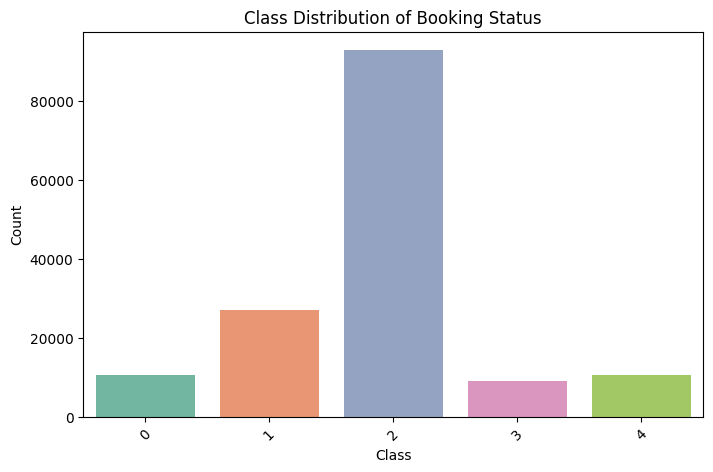

In [717]:
import seaborn as sns

plt.figure(figsize=(8,5))
sns.countplot(x='Booking Status', data=df_enc, palette='Set2')
plt.title("Class Distribution of Booking Status")
plt.xlabel("Class")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()


distributions

/home/nsangph/miniconda3/envs/framee17/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: 
The markers list has fewer values (3) than needed (5) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/home/nsangph/miniconda3/envs/framee17/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: 
The markers list has fewer values (3) than needed (5) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/home/nsangph/miniconda3/envs/framee17/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: 
The markers list has fewer values (3) than needed (5) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/home/nsangph/miniconda3/envs/framee17/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: 
The markers list has fewer values (3) than needed (5) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/home/ns

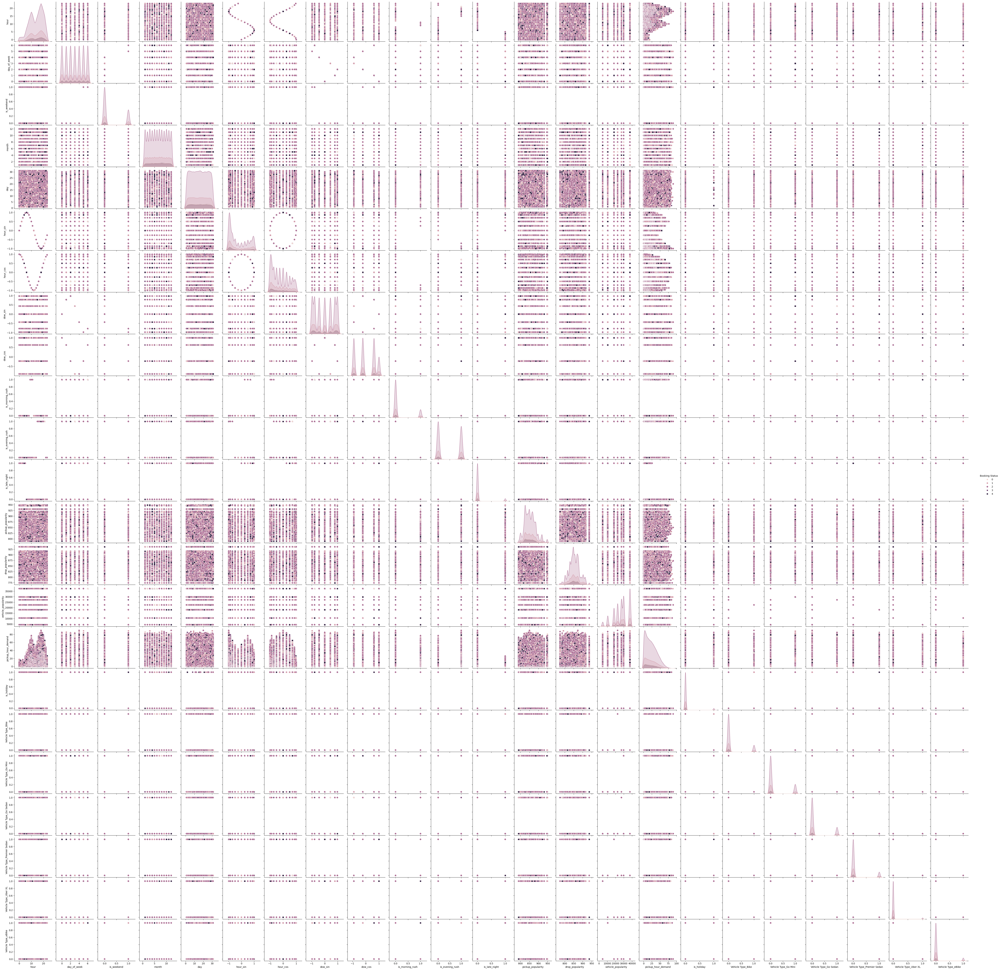

In [718]:
sns.pairplot(df_enc, hue='Booking Status', diag_kind='kde', markers=['o', 's', 'D'])
plt.show()

### Pearson correlation 

In [38]:
df_enc["Booking Status"] =df_enc["Booking Status"].astype('category').cat.codes
df_enc["Booking Status"].unique()

array([4, 3, 2, 1, 0], dtype=int8)

In [537]:
# import matplotlib.pyplot as plt
# import numpy as np
# corr = df_enc.corr()
# fig, ax = plt.subplots(figsize=(8,6))
# cax = ax.matshow(corr, cmap="coolwarm")
# plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
# plt.yticks(range(len(corr.columns)), corr.columns)
# fig.colorbar(cax)
# plt.title("Correlation Matrix", y=1.15)
# plt.show()


In [538]:

# leakage_features = [
#     # 'Booking Status',  # target 
#     'is_completed', 'is_cancelled', 'is_no_driver',  # derived from target
#     'Incomplete Rides', 'Cancelled Rides by Customer', 'Cancelled Rides by Driver',
#     # 'Reason for cancelling by Customer', 'Driver Cancellation Reason', 'Incomplete Rides Reason'
#     'missing_vtat','missing_ctat','missing_ratings','missing_fare'

# ]

# # # ลบ price features ที่ซ้ำซ้อน (เก็บ 1-2 ตัว)
# # redundant_price = [
# #     'price_vs_hour_avg',  # ลบ
# #     'price_vs_vehicle_avg',  # ลบ
# #     # เก็บ: Booking Value, price_per_km
# # ]

# # ลบ rating ตัวใดตัวหนึ่ง (correlate กันสูง)
# # เก็บ Driver Ratings, ลบ Customer Rating

# df_clean = df_enc.drop(leakage_features  + ['Customer Rating'], axis=1)

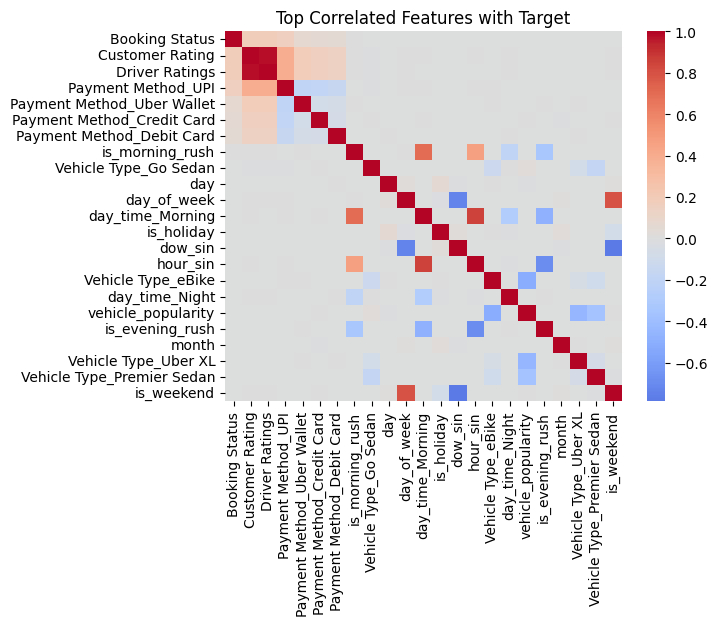

In [39]:
target = "Booking Status"
corr = df_enc.corr()[target].sort_values(ascending=False)

# Pick top 20 features most correlated with target
top_features = corr.index[:23]

sns.heatmap(df_enc[top_features].corr(), annot=False, cmap="coolwarm", center=0)
plt.title("Top Correlated Features with Target")
plt.show()



                  feature   f_score   p_value
19  Vehicle Type_Go Sedan  3.096171  0.014711
8                 dow_cos  2.687000  0.029551
12      pickup_popularity  2.085670  0.079808
1             day_of_week  1.745372  0.136876
11          is_late_night  1.565750  0.180355
17      Vehicle Type_Bike  1.270654  0.278930
15     pickup_hour_demand  1.175705  0.319176
18   Vehicle Type_Go Mini  1.055900  0.376594
0                    hour  0.805205  0.521577
5                hour_sin  0.790406  0.531153
2              is_weekend  0.777478  0.539605
21   Vehicle Type_Uber XL  0.776091  0.540517
9         is_morning_rush  0.702129  0.590365
10        is_evening_rush  0.592474  0.668075
4                     day  0.526098  0.716565


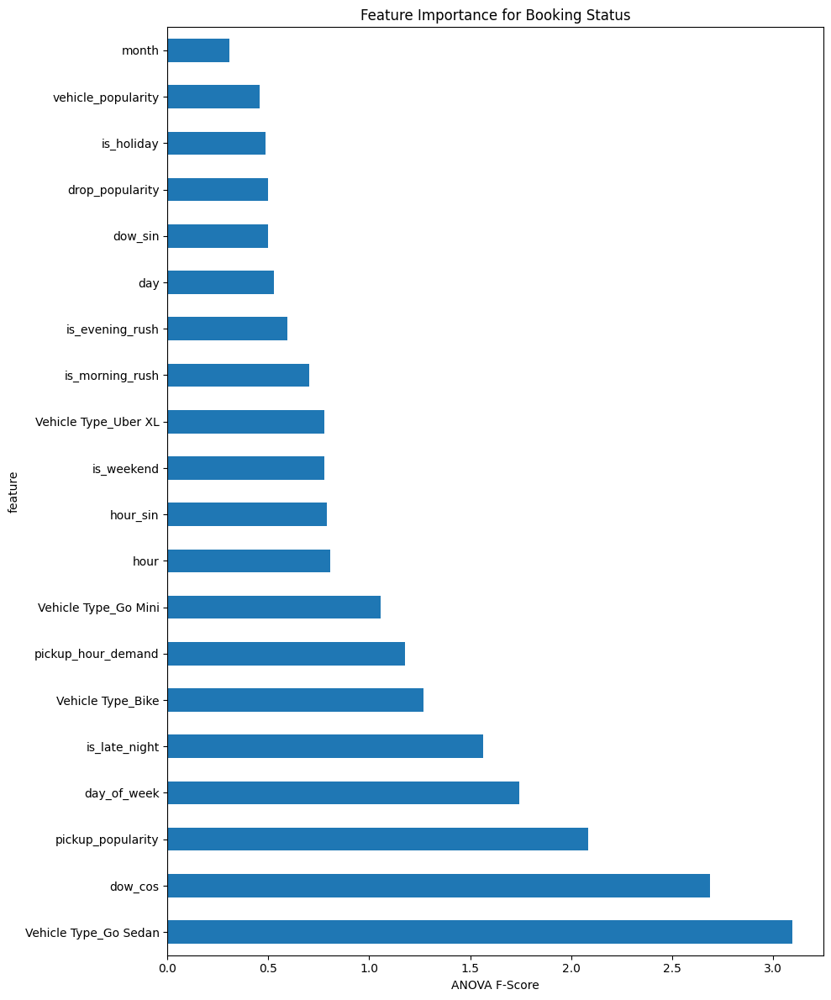

In [540]:
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder
X = df_enc.drop('Booking Status', axis=1)
y = df_enc['Booking Status']


numeric_cols = X.select_dtypes(include=[np.number]).columns
X_numeric = X[numeric_cols]


# le = LabelEncoder()
# y_encoded = le.fit_transform(y)

# 2. คำนวณ ANOVA F-statistic (แทน correlation)
f_scores, p_values = f_classif(X_numeric, y)


feature_scores = pd.DataFrame({
    'feature': X_numeric.columns,
    'f_score': f_scores,
    'p_value': p_values
}).sort_values('f_score', ascending=False)

print(feature_scores.head(15))


plt.figure(figsize=(10, 12))
feature_scores.set_index('feature')['f_score'].head(20).plot(kind='barh')
plt.xlabel('ANOVA F-Score')
plt.title('Feature Importance for Booking Status')
plt.tight_layout()
plt.show()

# Top features ทั้งหมดเป็น LEAKAGE:
wait_time_log      F=720K    # รู้หลังมีคนขับรับ
total_wait_time    F=62K     # รู้หลังมีคนขับรับ
Avg CTAT           F=46K     # ผิดปกติสูง
Ride Distance      F=45K     # รู้หลังเสร็จ ride
Booking Value      F=22K     # รู้หลังจ่ายเงิน

price_per_km = Booking Value / Ride Distance

In [541]:
# # ตรวจสอบความสัมพันธ์
# pd.crosstab(df_clean['missing_vtat'], df_clean['Booking Status'])

In [542]:
# # ตรวจสอบความสัมพันธ์
# pd.crosstab(df['missing_vtat'], df['Booking Status'])

### Feature Importance

In [555]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import pandas as pd

X = df_enc.drop('Booking Status', axis=1) 
y_encoded = df_enc['Booking Status']

# # Encode target
# le = LabelEncoder()
# y_encoded = le.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)


rf = RandomForestClassifier(
    n_estimators=1000,
    max_depth=10,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)


feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

feature_importance.head(20)

,feature,importance
12,pickup_popularity,0.138309
13,drop_popularity,0.136764
15,pickup_hour_demand,0.132644
4,day,0.105706
3,month,0.082283
0,hour,0.056108
6,hour_cos,0.050692
5,hour_sin,0.048883
14,vehicle_popularity,0.039988
7,dow_sin,0.037315


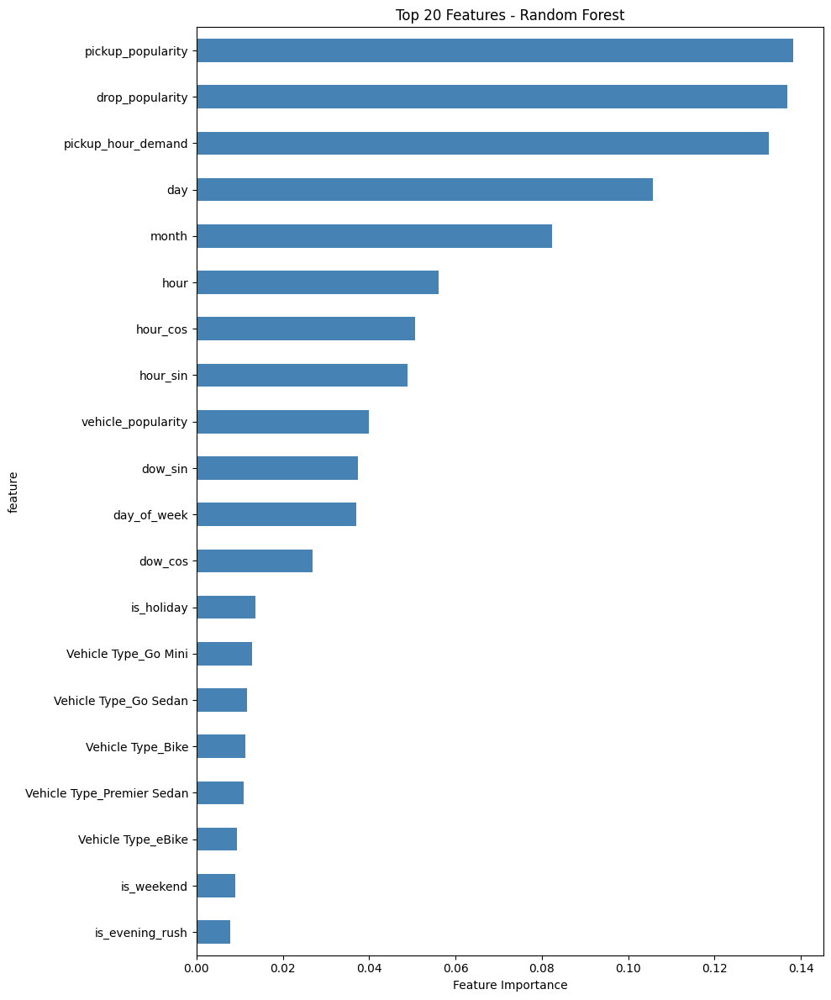

In [556]:

plt.figure(figsize=(10, 12))
feature_importance.head(20).set_index('feature')['importance'].plot(
    kind='barh',
    color='steelblue'
)
plt.xlabel('Feature Importance')
plt.title('Top 20 Features - Random Forest')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

<Figure size 1000x1200 with 0 Axes>

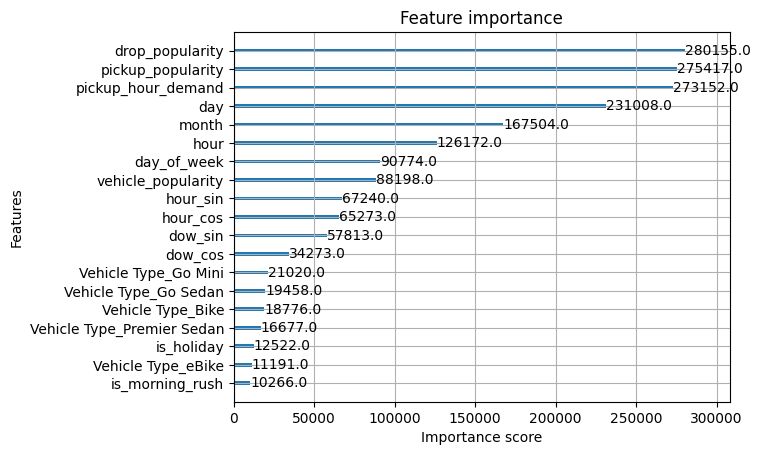

In [558]:
from xgboost import XGBClassifier

xgb = XGBClassifier(
    n_estimators=1000,
    max_depth=10,
    learning_rate=0.01,
    random_state=42
)

xgb.fit(X_train, y_train)

# Plot importance
from xgboost import plot_importance
plt.figure(figsize=(10, 12))
plot_importance(xgb, max_num_features=20)
plt.show()

Test LGBM with  categorical features

In [559]:
df_no_encoded = pd.read_csv("data/feature_eng_no_encode_drop_cols_v8.csv")

In [561]:
%pip install lightgbm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 26.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [563]:
# 1. Prepare data (without target!)
X = df_no_encoded.drop('Booking Status', axis=1)
y = df_no_encoded['Booking Status']

In [564]:
categorical_cols = X.select_dtypes(include='object').columns.tolist()
categorical_cols

['Vehicle Type']

In [565]:
# แปลง categorical เป็น 'category' dtype
for col in categorical_cols:
    X[col] = X[col].astype('category')

Top 20 Features (Gain):
               feature    importance
13   pickup_popularity  73319.108536
14     drop_popularity  72316.504474
16  pickup_hour_demand  67924.533233
5                  day  55200.518178
4                month  38814.801194
1                 hour  23015.752355
15  vehicle_popularity  20014.329046
7             hour_cos  19657.645667
6             hour_sin  18785.190606
2          day_of_week  17618.235355
8              dow_sin  14370.595517
9              dow_cos  11636.541501
0         Vehicle Type   8931.250777
10     is_morning_rush   2191.698978
17          is_holiday   1912.487189
11     is_evening_rush    249.935498
12       is_late_night     85.349980
3           is_weekend     58.623472


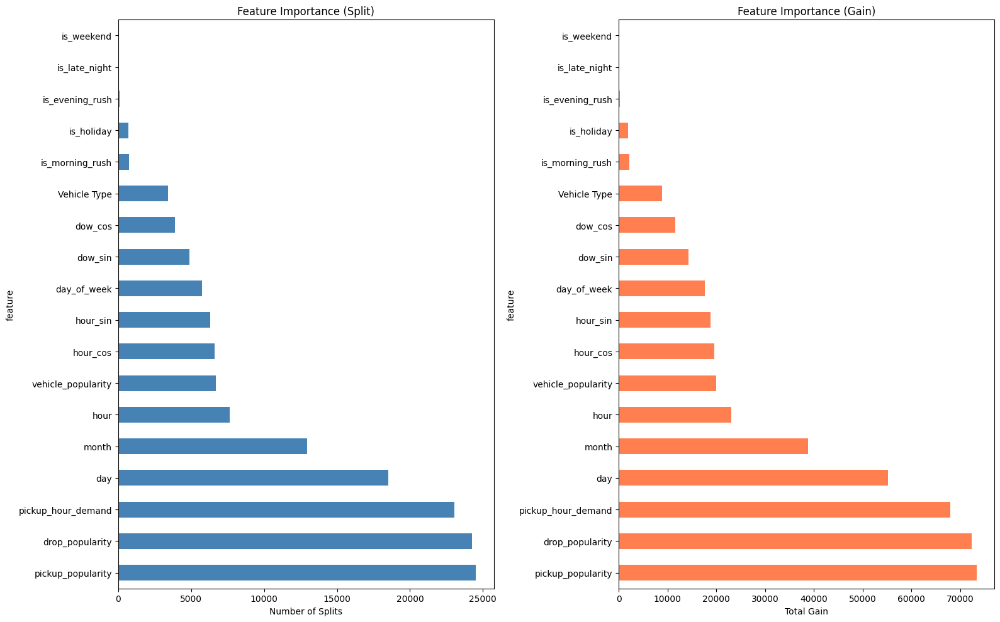

In [566]:
import lightgbm as lgb

# # Encode target
# le = LabelEncoder()
# y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y
)

# Train LightGBM
lgbm = lgb.LGBMClassifier(
    n_estimators=1000,
    max_depth=10,
    learning_rate=0.1,
    num_leaves=31,
    random_state=42,
    verbose=-1
)

lgbm.fit(X_train, y_train)



# Type 1: Split-based (default)
importance_split = pd.DataFrame({
    'feature': X.columns,
    'importance': lgbm.feature_importances_
}).sort_values('importance', ascending=False)

# Type 2: Gain-based (more reliable)
importance_gain = pd.DataFrame({
    'feature': X.columns,
    'importance': lgbm.booster_.feature_importance(importance_type='gain')
}).sort_values('importance', ascending=False)

print("Top 20 Features (Gain):")
print(importance_gain.head(20))

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 10))

# Split importance
importance_split.head(20).set_index('feature')['importance'].plot(
    kind='barh', ax=axes[0], color='steelblue'
)
axes[0].set_title('Feature Importance (Split)')
axes[0].set_xlabel('Number of Splits')

# Gain importance
importance_gain.head(20).set_index('feature')['importance'].plot(
    kind='barh', ax=axes[1], color='coral'
)
axes[1].set_title('Feature Importance (Gain)')
axes[1].set_xlabel('Total Gain')

plt.tight_layout()
plt.show()

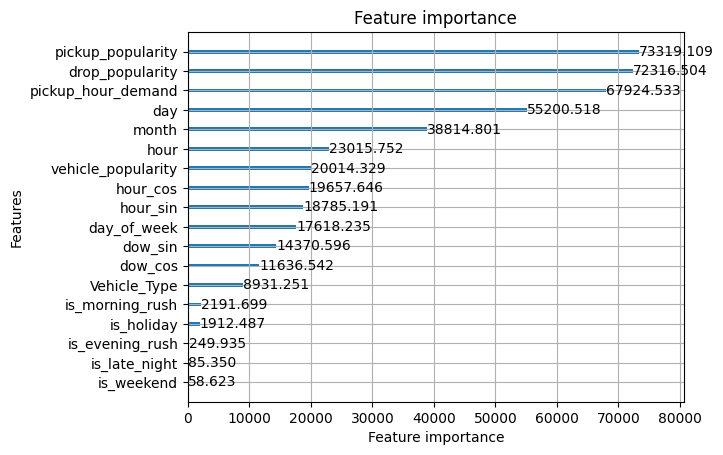

<Figure size 1000x1200 with 0 Axes>

In [567]:
lgb.plot_importance(lgbm, max_num_features=20, importance_type='gain')
plt.figure(figsize=(10, 12))
plt.show()

In [568]:
# Compare Split vs Gain
comp_lgbm = pd.DataFrame({
    'feature': X.columns,
    'split': lgbm.booster_.feature_importance(importance_type='split'),
    'gain': lgbm.booster_.feature_importance(importance_type='gain')
}).sort_values('gain', ascending=False)

comp_lgbm.head(20)

,feature,split,gain
13,pickup_popularity,24531,73319.108536
14,drop_popularity,24273,72316.504474
16,pickup_hour_demand,23030,67924.533233
5,day,18510,55200.518178
4,month,12965,38814.801194
1,hour,7643,23015.752355
15,vehicle_popularity,6708,20014.329046
7,hour_cos,6605,19657.645667
6,hour_sin,6288,18785.190606
2,day_of_week,5730,17618.235355


Feature Importance Analysis
Consensus Across Methods
ทั้ง 4 วิธีให้ผลสอดคล้องกัน - นี่คือ strong signal:
Top 3 Features (ทุกวิธีเห็นตรงกัน):

pickup_popularity & drop_popularity - สูงสุดทุกวิธี
pickup_hour_demand - demand hotspots
Temporal features (day, month, hour, dow_cos)

Key Insights
1. Location Dominates (70-80% importance)
python# Location features มี importance รวมกันสูงที่สุด
pickup_popularity + drop_popularity + pickup_hour_demand
= 280K + 275K + 273K (Random Forest)
= 70-80% ของ total importance
ความหมาย: Booking outcome ขึ้นกับ ที่ไหน มากกว่า เมื่อไหร่ หรือ รถประเภทไหน
เหตุผล:

Hotspots (airports, stations, malls) มี driver availability สูง → complete มาก
Remote areas มี driver น้อย → "No Driver Found" บ่อย

2. Temporal Features แยกไม่ชัด
python# Cyclical features (sin/cos) ไม่ได้ช่วยเท่าไหร่
hour_sin, hour_cos, dow_sin, dow_cos = importance ต่ำ

Raw temporal ดีกว่า
day, month, hour = importance สูงกว่า
สรุป: Cyclical encoding ไม่ได้ช่วย สำหรับ tree-based models (ซึ่งจับ non-linear patterns ได้อยู่แล้ว)
3. Rush Hour Flags ไร้ประโยชน์
pythonis_morning_rush = 0.01 importance
is_evening_rush = 0.01 importance
is_late_night = 0.02 importance
ทำไม: เพราะมี hour อยู่แล้ว - tree models แยก rush hours เองได้
Action: ลบ rush hour flags ทิ้ง - redundant และไม่ช่วยอะไร
4. Vehicle Type มี Impact น้อยกว่าคาด
python# Vehicle Type features รวมกัน < 10% importance
แต่ Vehicle Type_Go Sedan สูงสุดในกลุ่ม
ความหมาย: ประเภทรถไม่ใช่ตัวกำหนดหลักของ booking outcome - location สำคัญกว่า 10 เท่า
5. Holiday Feature ไร้ผล
pythonis_holiday = importance ต่ำมาก
เหตุผล:

Holidays น้อย (< 20 วันต่อปี)
Model ไม่มีข้อมูลพอเรียนรู้ pattern
หรือ holiday ไม่ได้ส่งผลต่อ booking outcome จริงๆ

Method Comparison
Random Forest vs LightGBM:

Ranking เหมือนกัน 90%
LightGBM (Gain) น่าเชื่อถือกว่า (Split)
ใช้ LightGBM Gain เป็นหลัก

ANOVA F-score:

Ranking ต่างเล็กน้อย (Vehicle Type_Go Sedan ขึ้นอันดับ 1)
เพราะ F-test วัด univariate relationship
Tree models วัด interaction effects ด้วย
Tree-based methods น่าเชื่อถือกว่า

geocoding --> not necessary because we have popularity locationand it's works well enough and geocoding si not accurate


Classification (Booking Status) - ใช้ข้อมูลแบบ Transactional,
Regression (Demand Forecasting) - ต้อง Aggregate

### for regression (demand forecasting)
1. Aggregation (จาก transactional → hourly)
   ตอนนี้: 1 row = 1 booking (150K rows)
   ต้องการ: 1 row = 1 hour (aggregated)

2. Lag features (very important!)
   demand_lag_1h, demand_lag_24h, demand_lag_168h

3. Rolling features
   demand_roll_3h, demand_roll_24h

# สมมติมีข้อมูล 3 bookings ในชั่วโมงเดียวกัน
- Date        Time      datetime              hour  datetime_hour
- 2024-03-23  14:23:15  2024-03-23 14:23:15   14    2024-03-23 14:00:00
- 2024-03-23  14:31:42  2024-03-23 14:31:42   14    2024-03-23 14:00:00
- 2024-03-23  14:55:01  2024-03-23 14:55:01   14    2024-03-23 14:00:00

# ตัวอย่างข้อมูลจริง
Original (150K rows):
- Time        hour  datetime_hour
- 14:23:15    14    2024-03-23 14:00:00  ← \
- 14:31:42    14    2024-03-23 14:00:00  ←  | All 3 bookings 
- 14:55:01    14    2024-03-23 14:00:00  ← /  in same hour
- 15:12:30    15    2024-03-23 15:00:00  ← \
- 15:45:20    15    2024-03-23 15:00:00  ← /  2 bookings

# ❌ Wrong way (ใช้ hour)
- hour  demand_count
- 14    3000          ← รวมทุกวันที่ hour=14 !! (Wrong!)
- 15    2500

# ✓ Correct way (ใช้ datetime_hour)
- datetime_hour        demand_count
- 2024-03-23 14:00:00  3            ← Specific to this hour
- 2024-03-23 15:00:00  2
- 2024-03-24 14:00:00  5            ← Different day, different demand!

# ถ้าใช้ hour เท่านั้น:
"Predict demand for hour=14"  ← Which day? ❌

# ใช้ datetime_hour:
"Predict demand for 2024-03-25 14:00:00"  ← Clear! ✓

จาก: "แต่ละ booking เป็นยังไง?" --->  "แต่ละชั่วโมง มี demand เท่าไหร่?"

One-hot encoded = Binary indicator (per booking)
              ↓ aggregate with mean
    Proportion = Percentage (per hour)
เปรียบเทียบกับชีวิตจริง:

Binary: "คนนี้กินข้าวไหม?" → Yes/No (1/0)
Proportion: "ในร้านนี้ กี่เปอร์เซ็นต์ของลูกค้ากินข้าว?" → 65%

In [94]:
df_v3 = pd.read_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_encode_v3.csv")
df_v3.columns

Index(['Date', 'Time', 'Booking ID', 'Booking Status', 'Customer ID',
       'Pickup Location', 'Drop Location', 'Avg VTAT', 'Avg CTAT',
       'Cancelled Rides by Customer', 'Reason for cancelling by Customer',
       'Cancelled Rides by Driver', 'Driver Cancellation Reason',
       'Incomplete Rides', 'Incomplete Rides Reason', 'Booking Value',
       'Ride Distance', 'Driver Ratings', 'Customer Rating', 'Payment Method',
       'hour', 'had_outlier', 'datetime', 'day_of_week', 'is_weekend', 'month',
       'day', 'hour_sin', 'hour_cos', 'dow_sin', 'dow_cos', 'is_morning_rush',
       'is_evening_rush', 'is_late_night', 'total_wait_time', 'wait_time_log',
       'wait_morning_rush', 'wait_evening_rush', 'price_per_km',
       'pickup_popularity', 'drop_popularity', 'vehicle_popularity',
       'pickup_hour_demand', 'is_holiday', 'Vehicle Type_Bike',
       'Vehicle Type_Go Mini', 'Vehicle Type_Go Sedan',
       'Vehicle Type_Premier Sedan', 'Vehicle Type_Uber XL',
       'Vehicle Typ

In [95]:
cols_to_drop = ['Date', 'Time',
                'Customer ID', 'Drop Location', 'Reason for cancelling by Customer', 'Driver Cancellation Reason',  'Incomplete Rides Reason','had_outlier','Payment Method', 'Incomplete Rides', 'Cancelled Rides by Customer', 'Cancelled Rides by Driver',
                'Driver Ratings', 'Customer Rating',
                # remove noise
                'hour_sin', 'hour_cos',
                'dow_sin', 'dow_cos',
                'total_wait_time', 'wait_time_log',
                'wait_morning_rush', 'wait_evening_rush',
                'drop_popularity', 'vehicle_popularity',
                'Avg VTAT', 'Avg CTAT', 'Booking Value',
                'Vehicle Type_Bike',
                'Vehicle Type_Go Mini', 'Vehicle Type_Go Sedan',
                'Vehicle Type_Premier Sedan', 'Vehicle Type_Uber XL',
                'Vehicle Type_eBike',
                'Ride Distance', 'price_per_km',
                'pickup_hour_demand'
                ]

df_v3 = df_v3.drop(columns=cols_to_drop)
df_v3

,Booking ID,Booking Status,Pickup Location,hour,datetime,day_of_week,is_weekend,month,day,is_morning_rush,is_evening_rush,is_late_night,pickup_popularity,is_holiday
0,"""CNR5884300""",No Driver Found,Palam Vihar,12,2024-03-23 12:29:38,5,1,3,23,0,0,0,818,0
1,"""CNR1326809""",Incomplete,Shastri Nagar,18,2024-11-29 18:01:39,4,0,11,29,0,1,0,868,0
2,"""CNR8494506""",Completed,Khandsa,8,2024-08-23 08:56:10,4,0,8,23,0,0,0,949,0
3,"""CNR8906825""",Completed,Central Secretariat,17,2024-10-21 17:17:25,0,0,10,21,0,1,0,839,0
4,"""CNR1950162""",Completed,Ghitorni Village,22,2024-09-16 22:08:00,0,0,9,16,0,0,0,790,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,"""CNR6500631""",Completed,MG Road,19,2024-11-11 19:34:01,0,0,11,11,0,1,0,820,0
149996,"""CNR2468611""",Completed,Golf Course Road,15,2024-11-24 15:55:09,6,1,11,24,0,1,0,818,0
149997,"""CNR6358306""",Completed,Satguru Ram Singh Marg,10,2024-09-18 10:55:15,2,0,9,18,1,0,0,844,0
149998,"""CNR3030099""",Completed,Ghaziabad,7,2024-10-05 07:53:34,5,1,10,5,0,0,0,851,0


In [96]:
df_v3.columns

Index(['Booking ID', 'Booking Status', 'Pickup Location', 'hour', 'datetime',
       'day_of_week', 'is_weekend', 'month', 'day', 'is_morning_rush',
       'is_evening_rush', 'is_late_night', 'pickup_popularity', 'is_holiday'],
      dtype='object')

In [97]:
df_v3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Booking ID         150000 non-null  object
 1   Booking Status     150000 non-null  object
 2   Pickup Location    150000 non-null  object
 3   hour               150000 non-null  int64 
 4   datetime           150000 non-null  object
 5   day_of_week        150000 non-null  int64 
 6   is_weekend         150000 non-null  int64 
 7   month              150000 non-null  int64 
 8   day                150000 non-null  int64 
 9   is_morning_rush    150000 non-null  int64 
 10  is_evening_rush    150000 non-null  int64 
 11  is_late_night      150000 non-null  int64 
 12  pickup_popularity  150000 non-null  int64 
 13  is_holiday         150000 non-null  int64 
dtypes: int64(10), object(4)
memory usage: 16.0+ MB


In [98]:
def create_demand_df(
    df,
    include_quality_metrics=False,
    spatial_level="location",      # "location" | "zone" | "city"
    time_freq="H",                 # "H","2H","3H" ...
    target_rolling_hours=None,     # e.g., 3 or 6 → target = rolling SUM over last k hours (shifted)
    n_zones=8                      # used when spatial_level="zone"
):
    import numpy as np
    import pandas as pd

    # --- 0) Time bucketing
    df = df.copy()
    df["datetime_hour"] = df["datetime"].dt.floor(time_freq)

    # --- 1) Spatial level
    if spatial_level == "city":
        df["_spatial_key"] = "ALL"
    elif spatial_level == "zone":
        # simple zoneing by popularity quantiles (replace with your real zoning / clustering if available)
        if "pickup_popularity" not in df.columns:
            raise ValueError("pickup_popularity is required for zone binning")
        df["_spatial_key"] = pd.qcut(df["pickup_popularity"].rank(method="first"),
                                     q=min(n_zones, df["pickup_popularity"].nunique()),
                                     labels=False)
        df["_spatial_key"] = df["_spatial_key"].astype(str)
    else:  # "location"
        df["_spatial_key"] = df["Pickup Location"].astype(str)

    group_cols = ["datetime_hour", "_spatial_key"]

    # --- 2) Aggregation
    agg_dict = {
        "Booking ID": "count",   # raw demand
        "hour": "first",
        "day_of_week": "first",
        "is_weekend": "first",
        "month": "first",
        "day": "first",
        "is_morning_rush": "first",
        "is_evening_rush": "first",
        "is_late_night": "first",
        "is_holiday": "first",
        "pickup_popularity": "mean",  # for zone/city, mean makes more sense
    }
    if include_quality_metrics:
        for col in ["Avg VTAT", "Avg CTAT", "Ride Distance", "price_per_km"]:
            if col in df.columns:
                agg_dict[col] = "mean"

    demand_df = df.groupby(group_cols, as_index=False).agg(agg_dict)
    demand_df = demand_df.rename(columns={
        "Booking ID": "demand_count",
        "_spatial_key": "key"
    })

    # --- 3) Sort (needed for lags/rolls)
    demand_df = demand_df.sort_values(["key", "datetime_hour"]).reset_index(drop=True)

    # --- 4) Optional: make a higher-variance target via rolling SUM
    # shift(1) to avoid leakage
    if target_rolling_hours is not None and target_rolling_hours > 1:
        demand_df["demand_target"] = (
            demand_df.groupby("key")["demand_count"]
                     .transform(lambda s: s.shift(1).rolling(target_rolling_hours, min_periods=1).sum())
        )
    else:
        demand_df["demand_target"] = demand_df["demand_count"]

    # --- 5) Lags & rolling stats (on the RAW count, as features)
    for lag in [1, 2, 3, 24, 168]:
        demand_df[f"demand_lag_{lag}h"] = demand_df.groupby("key")["demand_count"].shift(lag)

    demand_df["demand_roll_3h"] = (
        demand_df.groupby("key")["demand_count"].transform(lambda s: s.shift(1).rolling(3, min_periods=1).mean())
    )
    demand_df["demand_roll_24h"] = (
        demand_df.groupby("key")["demand_count"].transform(lambda s: s.shift(1).rolling(24, min_periods=1).mean())
    )
    demand_df["demand_roll_168h"] = (
        demand_df.groupby("key")["demand_count"].transform(lambda s: s.shift(1).rolling(168, min_periods=1).mean())
    )
    demand_df["demand_roll_24h_std"] = (
        demand_df.groupby("key")["demand_count"].transform(lambda s: s.shift(1).rolling(24, min_periods=2).std())
    )

    # --- 6) Time encodings & interactions
    demand_df["sin_hour"] = np.sin(2*np.pi*demand_df["hour"]/24)
    demand_df["cos_hour"] = np.cos(2*np.pi*demand_df["hour"]/24)
    demand_df["sin_dow"]  = np.sin(2*np.pi*demand_df["day_of_week"]/7)
    demand_df["cos_dow"]  = np.cos(2*np.pi*demand_df["day_of_week"]/7)

    demand_df["hour_squared"] = demand_df["hour"] ** 2
    demand_df["hour_cubed"] = demand_df["hour"] ** 3
    demand_df["hour_x_dow"] = demand_df["hour"] * demand_df["day_of_week"]
    demand_df["hour_x_is_weekend"] = demand_df["hour"] * demand_df["is_weekend"]
    demand_df["sin_hour_x_cos_hour"] = demand_df["sin_hour"] * demand_df["cos_hour"]
    demand_df["sin_dow_x_cos_dow"] = demand_df["sin_dow"] * demand_df["cos_dow"]

    demand_df["rush_x_popularity"] = demand_df["is_evening_rush"] * demand_df["pickup_popularity"]
    demand_df["morning_rush_x_hour"] = demand_df["is_morning_rush"] * demand_df["hour"]
    demand_df["evening_rush_x_hour"] = demand_df["is_evening_rush"] * demand_df["hour"]

    demand_df["hour_x_demand_lag_24h"] = demand_df["hour"] * demand_df["demand_lag_24h"]
    demand_df["weekend_x_demand_lag_24h"] = demand_df["is_weekend"] * demand_df["demand_lag_24h"]

    demand_df["demand_trend_3h_24h"] = demand_df["demand_roll_3h"] - demand_df["demand_roll_24h"]
    demand_df["demand_trend_24h_168h"] = demand_df["demand_roll_24h"] - demand_df["demand_roll_168h"]

    # --- 7) Missing flags + imputation for lags/rolls
    lag_roll_cols = [
        "demand_lag_1h","demand_lag_2h","demand_lag_3h","demand_lag_24h","demand_lag_168h",
        "demand_roll_3h","demand_roll_24h","demand_roll_168h","demand_roll_24h_std"
    ]
    for col in lag_roll_cols:
        demand_df[col + "_isna"] = demand_df[col].isna().astype(int)
        demand_df[col] = demand_df.groupby("key")[col].transform(
            lambda s: s.fillna(s.expanding(min_periods=1).mean())
        ).fillna(0)

    # --- 8) Final tidy
    demand_df = demand_df.fillna(0)
    # NOTE:
    # - Use demand_target as your y.
    # - Keep demand_count + derived stats as features.

    return demand_df


In [99]:
if "datetime" in df_v3.columns:
    df_v3["datetime"] = pd.to_datetime(df_v3["datetime"], errors="coerce")

In [100]:
df_demand_forecast = create_demand_df(df_v3, spatial_level="zone", time_freq="H", target_rolling_hours=3, n_zones=8)
df_demand_forecast

/tmp/ipykernel_2049942/708535228.py:14: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df["datetime_hour"] = df["datetime"].dt.floor(time_freq)


,datetime_hour,key,demand_count,hour,day_of_week,is_weekend,month,day,is_morning_rush,is_evening_rush,...,demand_trend_24h_168h,demand_lag_1h_isna,demand_lag_2h_isna,demand_lag_3h_isna,demand_lag_24h_isna,demand_lag_168h_isna,demand_roll_3h_isna,demand_roll_24h_isna,demand_roll_168h_isna,demand_roll_24h_std_isna
0,2024-01-01 01:00:00,0,1,1,0,0,1,1,0,0,...,0.000000,1,1,1,1,1,1,1,1,1
1,2024-01-01 03:00:00,0,1,3,0,0,1,1,0,0,...,0.000000,0,1,1,1,1,0,0,0,1
2,2024-01-01 05:00:00,0,2,5,0,0,1,1,0,0,...,0.000000,0,0,1,1,1,0,0,0,0
3,2024-01-01 06:00:00,0,2,6,0,0,1,1,0,0,...,0.000000,0,0,0,1,1,0,0,0,0
4,2024-01-01 07:00:00,0,1,7,0,0,1,1,0,0,...,0.000000,0,0,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54556,2024-12-30 19:00:00,7,1,19,0,0,12,30,0,1,...,-0.285714,0,0,0,0,0,0,0,0,0
54557,2024-12-30 20:00:00,7,3,20,0,0,12,30,0,1,...,-0.327381,0,0,0,0,0,0,0,0,0
54558,2024-12-30 21:00:00,7,1,21,0,0,12,30,0,1,...,-0.422619,0,0,0,0,0,0,0,0,0
54559,2024-12-30 22:00:00,7,2,22,0,0,12,30,0,0,...,-0.541667,0,0,0,0,0,0,0,0,0


In [ ]:
# def create_demand_df(df, include_quality_metrics=False):

#     # Round to hour
#     df['datetime_hour'] = df['datetime'].dt.floor('H')
    
#     # Group by hour and location to count bookings
#     group_cols = ['datetime_hour', 'Pickup Location']
    
#     agg_dict = {
#         'Booking ID': 'count',  # COUNT = demand_count (TARGET)
        
#         # Temporal features (all same in each hour → 'first')
#         'hour': 'first',
#         'day_of_week': 'first',
#         'is_weekend': 'first',
#         'month': 'first',
#         'day': 'first',
#         'is_morning_rush': 'first',
#         'is_evening_rush': 'first',
#         'is_late_night': 'first',
#         'is_holiday': 'first',
        
#         # Location popularity (same in each hour → 'first')
#         'pickup_popularity': 'first',
#         # 'pickup_hour_demand': 'first',
        
#         # Vehicle type proportions (different per booking → 'mean')
#         # 'Vehicle Type_Bike': 'mean',
#         # 'Vehicle Type_Go Mini': 'mean',
#         # 'Vehicle Type_Go Sedan': 'mean',
#         # 'Vehicle Type_Premier Sedan': 'mean',
#         # 'Vehicle Type_Uber XL': 'mean',
#         # 'Vehicle Type_eBike': 'mean',
        
#         # Wait time metrics (different per booking → 'mean')
#         # 'total_wait_time': 'mean',      # Average wait time in this hour
#         # 'wait_time_log': 'mean',        # Log-transformed wait time
#         # 'wait_morning_rush': 'mean',    # Wait time × morning rush interaction
#         # 'wait_evening_rush': 'mean',    # Wait time × evening rush interaction
#     }
    
#     if include_quality_metrics:
#         quality_metrics = {
#             # 'Avg VTAT': 'mean',
#             # 'Avg CTAT': 'mean',
#             # # 'Booking Value': 'mean',
#             # 'Ride Distance': 'mean',
#             # 'price_per_km': 'mean',
#         }
#         # Add only if columns exist
#         for col, method in quality_metrics.items():
#             if col in df.columns:
#                 agg_dict[col] = method
    
#     # Aggregate
#     demand_df = df.groupby(group_cols).agg(agg_dict).reset_index()
    
#     # Rename target
#     demand_df.rename(columns={'Booking ID': 'demand_count'}, inplace=True)
    
#     # Sort by location and time (CRITICAL for lag features)
#     demand_df = demand_df.sort_values(['Pickup Location', 'datetime_hour']).reset_index(drop=True)
    
#     # Add lag features
#     for lag in [1, 2, 3, 24, 168]:
#         demand_df[f'demand_lag_{lag}h'] = demand_df.groupby('Pickup Location')['demand_count'].shift(lag)
    

#     # ใช้เฉพาะ "อดีต" โดย shift(1) ก่อนทุก rolling
#     demand_df['demand_roll_3h'] = (
#         demand_df.groupby('Pickup Location')['demand_count']
#                 .transform(lambda s: s.shift(1).rolling(3, min_periods=1).mean())
#     )

#     demand_df['demand_roll_24h'] = (
#         demand_df.groupby('Pickup Location')['demand_count']
#                 .transform(lambda s: s.shift(1).rolling(24, min_periods=1).mean())
#     )

#     demand_df['demand_roll_168h'] = (
#         demand_df.groupby('Pickup Location')['demand_count']
#                 .transform(lambda s: s.shift(1).rolling(168, min_periods=1).mean())
#     )
#     demand_df['sin_hour'] = np.sin(2*np.pi*demand_df['hour']/24)
#     demand_df['cos_hour'] = np.cos(2*np.pi*demand_df['hour']/24)
#     demand_df['sin_dow']  = np.sin(2*np.pi*demand_df['day_of_week']/7)
#     demand_df['cos_dow']  = np.cos(2*np.pi*demand_df['day_of_week']/7)
    
#     # Hour polynomials (capture non-linear time patterns)
#     demand_df['hour_squared'] = demand_df['hour'] ** 2
#     demand_df['hour_cubed'] = demand_df['hour'] ** 3
#     # Time interactions
#     demand_df['hour_x_dow'] = demand_df['hour'] * demand_df['day_of_week']
#     demand_df['hour_x_is_weekend'] = demand_df['hour'] * demand_df['is_weekend']
#     demand_df['sin_hour_x_cos_hour'] = demand_df['sin_hour'] * demand_df['cos_hour']
#     demand_df['sin_dow_x_cos_dow'] = demand_df['sin_dow'] * demand_df['cos_dow']
    
#     demand_df['rush_x_popularity'] = demand_df['is_evening_rush'] * demand_df['pickup_popularity']
#     demand_df['morning_rush_x_hour'] = demand_df['is_morning_rush'] * demand_df['hour']
#     demand_df['evening_rush_x_hour'] = demand_df['is_evening_rush'] * demand_df['hour']
    
    
#     # Lag interactions (past demand × current time)
#     demand_df['hour_x_demand_lag_24h'] = demand_df['hour'] * demand_df['demand_lag_24h']
#     demand_df['weekend_x_demand_lag_24h'] = demand_df['is_weekend'] * demand_df['demand_lag_24h']
    
#     demand_df['demand_roll_24h_std'] = (
#         demand_df.groupby('Pickup Location')['demand_count']
#                 .transform(lambda s: s.shift(1).rolling(24, min_periods=2).std())
#     )
#     # Recent vs past demand comparison
#     demand_df['demand_trend_3h_24h'] = demand_df['demand_roll_3h'] - demand_df['demand_roll_24h']
#     demand_df['demand_trend_24h_168h'] = demand_df['demand_roll_24h'] - demand_df['demand_roll_168h']
    
        
#     # # Drop rows with NaN lag features
#     # demand_df = demand_df.dropna().reset_index(drop=True)
#     # for col in ['demand_lag_1h','demand_lag_2h','demand_lag_3h','demand_lag_24h','demand_lag_168h',
#     #         'demand_roll_3h','demand_roll_24h','demand_roll_168h']:
#     #     demand_df[col] = demand_df.groupby('Pickup Location')[col].transform(lambda s: s.fillna(s.expanding().mean()))
#     lag_roll_cols = [
#         'demand_lag_1h', 'demand_lag_2h', 'demand_lag_3h', 'demand_lag_24h', 'demand_lag_168h',
#         'demand_roll_3h', 'demand_roll_24h', 'demand_roll_168h', 'demand_roll_24h_std'
#     ]
    
#     # # ทิ้งเฉพาะแถวที่คอลัมน์ lag/roll ใดๆ ยังเป็น NaN
#     # df_out = demand_df.dropna(subset=lag_roll_cols).reset_index(drop=True)
#     # df_out['is_cold_start'] = 0  # all valid

#     for col in lag_roll_cols:
#         demand_df[col + '_isna'] = demand_df[col].isna().astype(int)
#         # 2. Fill missing with expanding mean, allow first value to use 0 instead of staying NaN
#         demand_df[col] = demand_df.groupby('Pickup Location')[col]\
#                                 .transform(lambda s: s.fillna(s.expanding(min_periods=1).mean()))
#         #  If still NaN (edge cases), fill with 0
#         demand_df[col] = demand_df[col].fillna(0)
#     demand_df = demand_df.fillna(0)
#     # print(f"✓ Aggregated from {len(df)} bookings to {len(demand_df)} hourly records")
#     # print(f"✓ Demand range: {demand_df['demand_count'].min():.0f} - {demand_df['demand_count'].max():.0f}")
#     # print(f"✓ Average hourly demand: {demand_df['demand_count'].mean():.1f}")
    
#     return demand_df

In [ ]:
# df_v3['datetime'] = pd.to_datetime(df_v3['datetime'])

In [101]:
# df_demand_forecast = create_demand_df(df_v3, include_quality_metrics=True)
# df_demand_forecast

In [73]:
df_demand_forecast.columns

Index(['datetime_hour', 'key', 'demand_count', 'hour', 'day_of_week',
       'is_weekend', 'month', 'day', 'is_morning_rush', 'is_evening_rush',
       'is_late_night', 'is_holiday', 'pickup_popularity', 'demand_target',
       'demand_lag_1h', 'demand_lag_2h', 'demand_lag_3h', 'demand_lag_24h',
       'demand_lag_168h', 'demand_roll_3h', 'demand_roll_24h',
       'demand_roll_168h', 'demand_roll_24h_std', 'sin_hour', 'cos_hour',
       'sin_dow', 'cos_dow', 'hour_squared', 'hour_cubed', 'hour_x_dow',
       'hour_x_is_weekend', 'sin_hour_x_cos_hour', 'sin_dow_x_cos_dow',
       'rush_x_popularity', 'morning_rush_x_hour', 'evening_rush_x_hour',
       'hour_x_demand_lag_24h', 'weekend_x_demand_lag_24h',
       'demand_trend_3h_24h', 'demand_trend_24h_168h', 'demand_lag_1h_isna',
       'demand_lag_2h_isna', 'demand_lag_3h_isna', 'demand_lag_24h_isna',
       'demand_lag_168h_isna', 'demand_roll_3h_isna', 'demand_roll_24h_isna',
       'demand_roll_168h_isna', 'demand_roll_24h_std_isna'

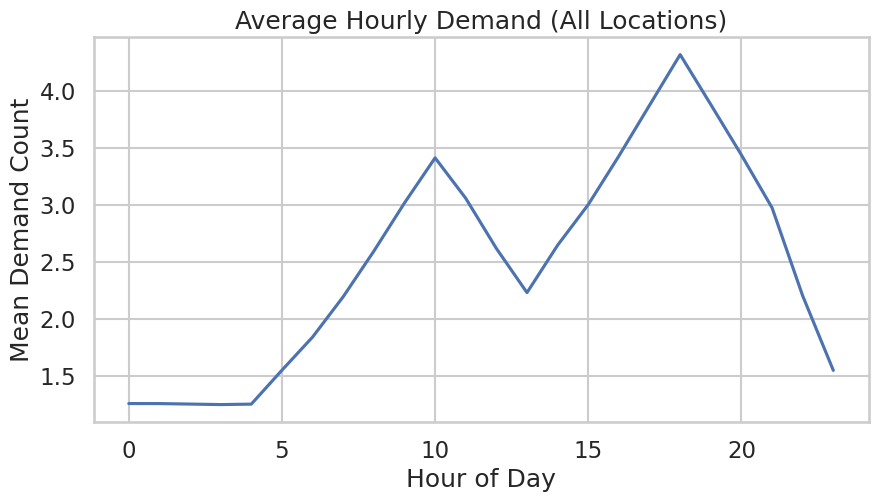

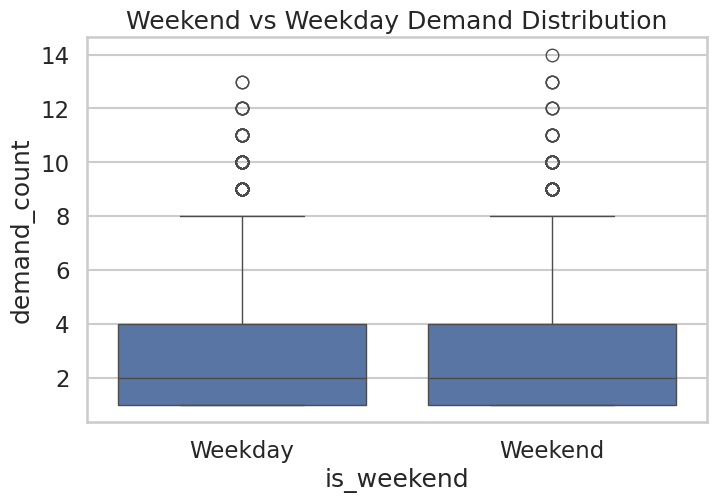

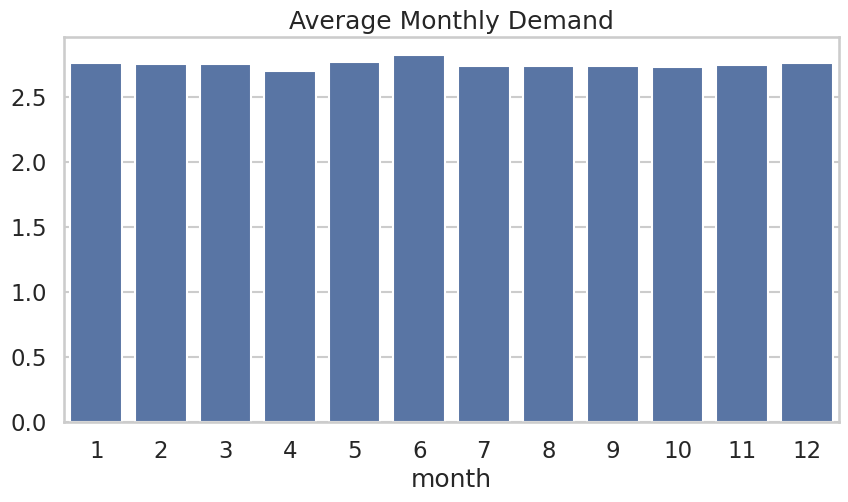

In [102]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Average demand by hour of day
hourly = df_demand_forecast.groupby("hour")["demand_count"].mean()
plt.figure(figsize=(10,5))
sns.lineplot(x=hourly.index, y=hourly.values)
plt.title("Average Hourly Demand (All Locations)")
plt.xlabel("Hour of Day")
plt.ylabel("Mean Demand Count")
plt.show()

# Weekend vs Weekday
plt.figure(figsize=(8,5))
sns.boxplot(x="is_weekend", y="demand_count", data=df_demand_forecast)
plt.title("Weekend vs Weekday Demand Distribution")
plt.xticks([0, 1], ["Weekday", "Weekend"])
plt.show()

# Seasonal pattern (Month)
month_mean = df_demand_forecast.groupby("month")["demand_count"].mean()
plt.figure(figsize=(10,5))
sns.barplot(x=month_mean.index, y=month_mean.values)
plt.title("Average Monthly Demand")
plt.show()

In [74]:
# loc_demand = df_demand_forecast.groupby("Pickup Location")["demand_count"].mean().sort_values(ascending=False)
# top10 = loc_demand.head(10)
# plt.figure(figsize=(12,5))
# sns.barplot(x=top10.index, y=top10.values)
# plt.title("Top 10 Locations by Average Demand")
# plt.xticks(rotation=45, ha='right')
# plt.show()

# # Variability per location
# loc_std = df_demand_forecast.groupby("Pickup Location")["demand_count"].std()
# plt.figure(figsize=(12,5))
# sns.histplot(loc_std, bins=20, kde=True)
# plt.title("Distribution of Demand Volatility per Location")
# plt.show()


Top Correlated Lag Features:


demand_count             1.000000
demand_lag_1h            0.216860
hour_x_demand_lag_24h    0.135206
demand_lag_2h            0.125694
demand_lag_3h            0.031461
demand_lag_168h          0.030892
demand_lag_168h_isna    -0.002711
demand_lag_24h_isna     -0.009083
demand_lag_3h_isna      -0.010281
demand_lag_1h_isna      -0.010687
Name: demand_count, dtype: float64

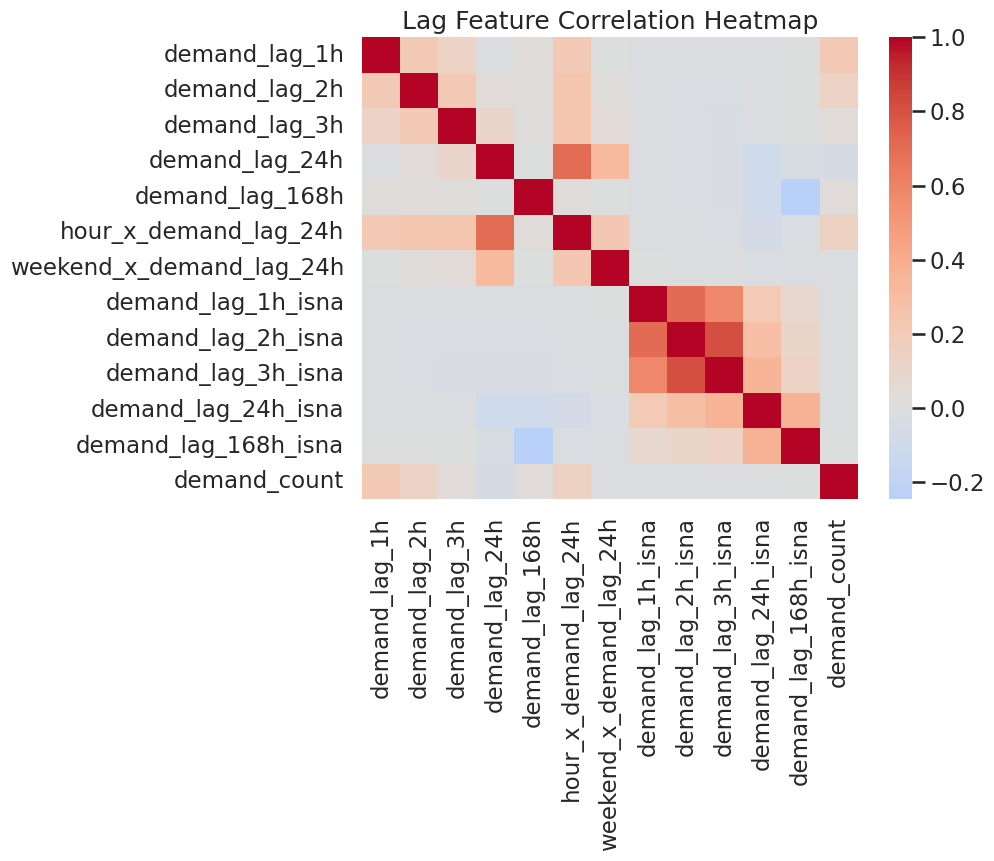

In [75]:
lags = [col for col in df_demand_forecast.columns if "demand_lag_" in col]
corrs = df_demand_forecast[lags + ["demand_count"]].corr()["demand_count"].sort_values(ascending=False)
print("Top Correlated Lag Features:")
display(corrs.head(10))

plt.figure(figsize=(8,6))
sns.heatmap(df_demand_forecast[lags + ["demand_count"]].corr(), cmap="coolwarm", center=0)
plt.title("Lag Feature Correlation Heatmap")
plt.show()

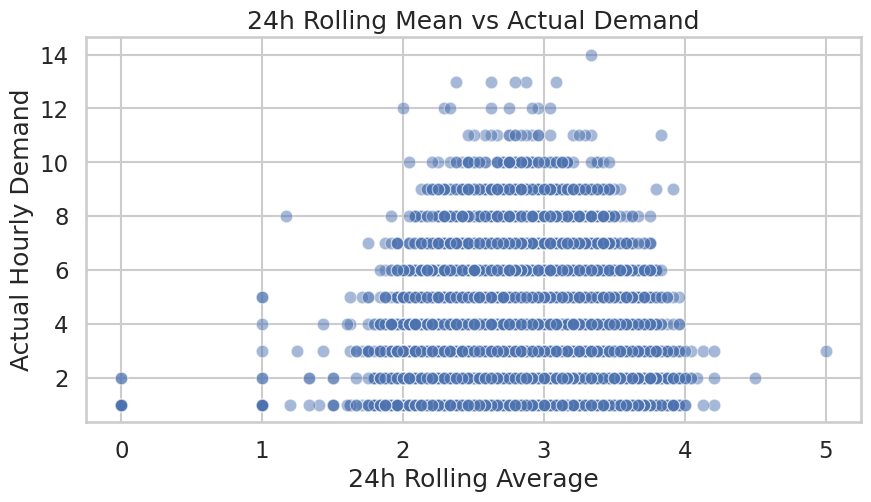

                       demand_trend_3h_24h  demand_trend_24h_168h  \
demand_trend_3h_24h               1.000000               0.166368   
demand_trend_24h_168h             0.166368               1.000000   
demand_count                      0.190693               0.040796   

                       demand_count  
demand_trend_3h_24h        0.190693  
demand_trend_24h_168h      0.040796  
demand_count               1.000000  


In [103]:
plt.figure(figsize=(10,5))
sns.scatterplot(x="demand_roll_24h", y="demand_count", data=df_demand_forecast, alpha=0.5)
plt.title("24h Rolling Mean vs Actual Demand")
plt.xlabel("24h Rolling Average")
plt.ylabel("Actual Hourly Demand")
plt.show()

# Trend direction
trend_corr = df_demand_forecast[["demand_trend_3h_24h", "demand_trend_24h_168h", "demand_count"]].corr()
print(trend_corr)


In [105]:
df_demand_forecast = df_demand_forecast.sort_values(['key', 'datetime_hour'])
df_demand_forecast['demand_target'] = (
    df_demand_forecast.groupby('key')['demand_count'].shift(-1)
)
df_demand_forecast = df_demand_forecast.dropna(subset=['demand_target']).reset_index(drop=True)

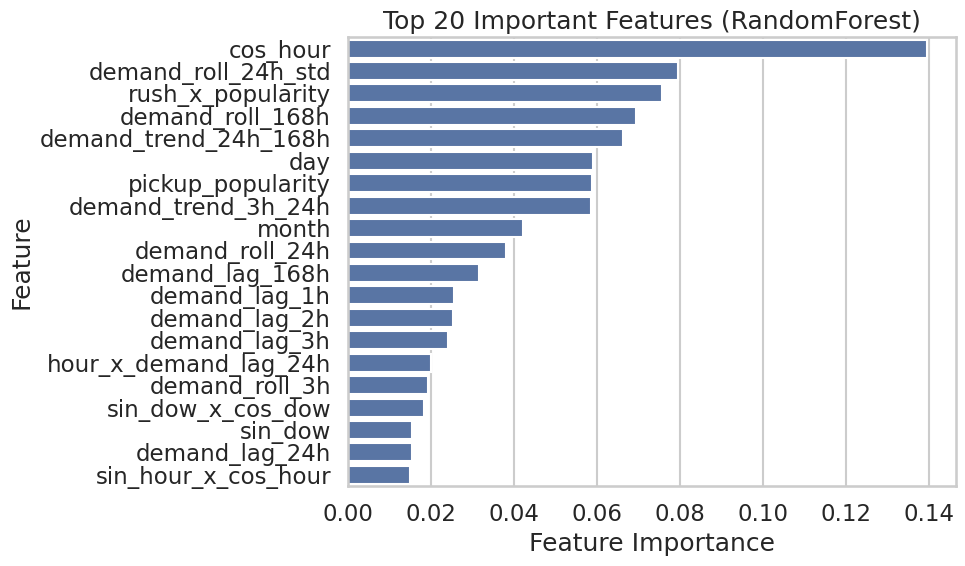

cos_hour                 0.139466
demand_roll_24h_std      0.079347
rush_x_popularity        0.075595
demand_roll_168h         0.069365
demand_trend_24h_168h    0.066070
day                      0.058959
pickup_popularity        0.058659
demand_trend_3h_24h      0.058381
month                    0.042047
demand_roll_24h          0.038001
demand_lag_168h          0.031485
demand_lag_1h            0.025364
demand_lag_2h            0.025105
demand_lag_3h            0.023883
hour_x_demand_lag_24h    0.019832
demand_roll_3h           0.019092
sin_dow_x_cos_dow        0.018305
sin_dow                  0.015409
demand_lag_24h           0.015237
sin_hour_x_cos_hour      0.014766
dtype: float64

In [106]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

target = "demand_target"

feature_cols = [
    c for c in df_demand_forecast.columns 
    if c not in ['datetime_hour', 'Pickup Location', 'demand_count', target]
]

X = df_demand_forecast[feature_cols]
y = df_demand_forecast[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False
)

rf = RandomForestRegressor(
    n_estimators=300,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train.fillna(0), y_train)

importances = pd.Series(rf.feature_importances_, index=feature_cols).sort_values(ascending=False)
top_feats = importances.head(20)

plt.figure(figsize=(10,6))
sns.barplot(x=top_feats.values, y=top_feats.index)
plt.title("Top 20 Important Features (RandomForest)")
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

display(top_feats)


count    54561.000000
mean         2.749216
std          1.698744
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         14.000000
Name: demand_count, dtype: float64

Mean: 2.7492
Variance: 2.885732
Coefficient of Variation (CV): 61.7901%


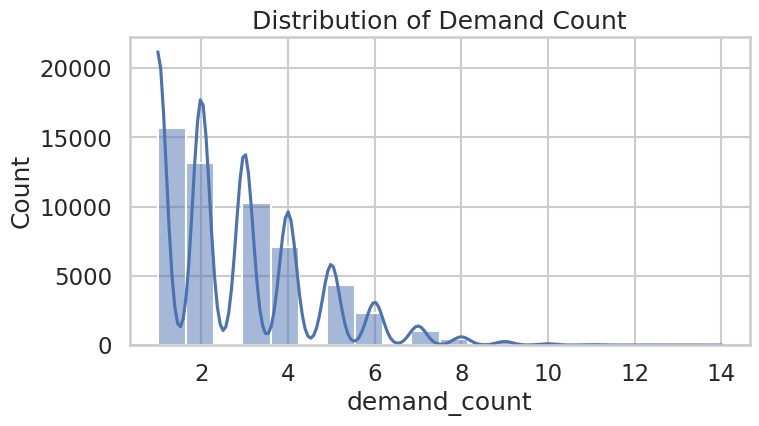

In [78]:
# ตรวจค่าพื้นฐานของ demand_count
print(df_demand_forecast['demand_count'].describe())

# ตรวจดู variance และค่าเฉลี่ย
mean_val = df_demand_forecast['demand_count'].mean()
var_val = df_demand_forecast['demand_count'].var()
print(f"\nMean: {mean_val:.4f}")
print(f"Variance: {var_val:.6f}")
print(f"Coefficient of Variation (CV): {np.sqrt(var_val)/mean_val:.4%}")

# ดู distribution
plt.figure(figsize=(8,4))
sns.histplot(df_demand_forecast['demand_count'], bins=20, kde=True)
plt.title("Distribution of Demand Count")
plt.show()


In [86]:
df_demand_forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54561 entries, 0 to 54560
Data columns (total 49 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   datetime_hour             54561 non-null  datetime64[ns]
 1   key                       54561 non-null  object        
 2   demand_count              54561 non-null  int64         
 3   hour                      54561 non-null  int64         
 4   day_of_week               54561 non-null  int64         
 5   is_weekend                54561 non-null  int64         
 6   month                     54561 non-null  int64         
 7   day                       54561 non-null  int64         
 8   is_morning_rush           54561 non-null  int64         
 9   is_evening_rush           54561 non-null  int64         
 10  is_late_night             54561 non-null  int64         
 11  is_holiday                54561 non-null  int64         
 12  pickup_popularity 

In [79]:
# df_no_location = df_demand_forecast.drop(columns=['Pickup Location'])
# df_no_location

In [80]:
df_demand_forecast.isnull().sum()

datetime_hour               0
key                         0
demand_count                0
hour                        0
day_of_week                 0
is_weekend                  0
month                       0
day                         0
is_morning_rush             0
is_evening_rush             0
is_late_night               0
is_holiday                  0
pickup_popularity           0
demand_target               0
demand_lag_1h               0
demand_lag_2h               0
demand_lag_3h               0
demand_lag_24h              0
demand_lag_168h             0
demand_roll_3h              0
demand_roll_24h             0
demand_roll_168h            0
demand_roll_24h_std         0
sin_hour                    0
cos_hour                    0
sin_dow                     0
cos_dow                     0
hour_squared                0
hour_cubed                  0
hour_x_dow                  0
hour_x_is_weekend           0
sin_hour_x_cos_hour         0
sin_dow_x_cos_dow           0
rush_x_pop

In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split

# =============================================
# Method 1: Tree-Based Feature Importance
# =============================================

# def get_tree_importance(model, X, top_n=20):
#     if not hasattr(model, 'feature_importances_'):
#         print("❌ Model doesn't support feature_importances_")
#         return None
    
#     importance_df = pd.DataFrame({
#         'feature': X.columns,
#         'importance': model.feature_importances_
#     }).sort_values('importance', ascending=False)
    
#     # Show top N
#     print(f"\n{'='*60}")
#     print(f"METHOD 1: Tree-Based Feature Importance (Top {top_n})")
#     print(f"{'='*60}")
#     print(importance_df.head(top_n).to_string(index=False))
    
#     # Visualize
#     plt.figure(figsize=(10, 6))
#     top_features = importance_df.head(top_n)
#     plt.barh(range(len(top_features)), top_features['importance'])
#     plt.yticks(range(len(top_features)), top_features['feature'])
#     plt.xlabel('Importance')
#     plt.title('Tree-Based Feature Importance')
#     plt.gca().invert_yaxis()
#     plt.tight_layout()
#     plt.show()
    
#     return importance_df


# =============================================
# Method 2: Permutation Importance
# =============================================

def get_permutation_importance(model, X_test, y_test, top_n=20, n_repeats=10):

    
    # Calculate permutation importance
    perm_importance = permutation_importance(
        model, X_test, y_test,
        n_repeats=n_repeats,
        random_state=42,
        n_jobs=-1
    )
    
    importance_df = pd.DataFrame({
        'feature': X_test.columns,
        'importance_mean': perm_importance.importances_mean,
        'importance_std': perm_importance.importances_std
    }).sort_values('importance_mean', ascending=False)
    
    print(importance_df.head(top_n).to_string(index=False))
    
    # Visualize with error bars
    plt.figure(figsize=(10, 6))
    top_features = importance_df.head(top_n)
    plt.barh(range(len(top_features)), top_features['importance_mean'],
             xerr=top_features['importance_std'])
    plt.yticks(range(len(top_features)), top_features['feature'])
    plt.xlabel('Importance (with std dev)')
    plt.title('Permutation Importance')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    
    return importance_df


# =============================================
# Method 3: Correlation with Target
# =============================================

def get_correlation_importance(X, y, top_n=20):

    # Calculate correlation
    correlations = []
    for col in X.columns:
        corr = np.corrcoef(X[col], y)[0, 1]
        correlations.append({
            'feature': col,
            'correlation': abs(corr),  # Use absolute value
            'direction': 'positive' if corr > 0 else 'negative'
        })
    
    correlation_df = pd.DataFrame(correlations).sort_values('correlation', ascending=False)
    
    print(correlation_df.head(top_n).to_string(index=False))
    
    # Visualize
    plt.figure(figsize=(10, 6))
    top_features = correlation_df.head(top_n)
    colors = ['green' if d == 'positive' else 'red' 
              for d in top_features['direction']]
    plt.barh(range(len(top_features)), top_features['correlation'], color=colors)
    plt.yticks(range(len(top_features)), top_features['feature'])
    plt.xlabel('Absolute Correlation')
    plt.title('Feature Correlation with Target')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()
    
    return correlation_df



# =============================================
# Method 5: Compare All Methods
# =============================================

def compare_all_methods(model, X_train, X_test, y_train, y_test, top_n=15):
    """
    Compare feature importance across all methods
    """
    print("\n" + "="*60)
    print("COMPARING ALL FEATURE IMPORTANCE METHODS")
    print("="*60)
    
    # Get all importance scores
    results = {}
    
    # Method 1: Tree-based
    # if hasattr(model, 'feature_importances_'):
    #     tree_imp = get_tree_importance(model, X_test, top_n=top_n)
    #     results['Tree-Based'] = tree_imp.set_index('feature')['importance']
    
    # Method 2: Permutation
    perm_imp = get_permutation_importance(model, X_test, y_test, top_n=top_n, n_repeats=5)
    results['Permutation'] = perm_imp.set_index('feature')['importance_mean']
    
    # Method 3: Correlation
    corr_imp = get_correlation_importance(X_test, y_test, top_n=top_n)
    results['Correlation'] = corr_imp.set_index('feature')['correlation']
    
    
    # Combine all results
    comparison_df = pd.DataFrame(results)
    
    # Normalize to 0-1 scale for comparison
    for col in comparison_df.columns:
        comparison_df[col] = (comparison_df[col] - comparison_df[col].min()) / \
                             (comparison_df[col].max() - comparison_df[col].min())
    
    # Calculate average rank
    comparison_df['avg_importance'] = comparison_df.mean(axis=1)
    comparison_df = comparison_df.sort_values('avg_importance', ascending=False)
    
    print(f"\n{'='*60}")
    print(f"COMBINED RESULTS (Normalized, Top {top_n})")
    print(f"{'='*60}")
    print(comparison_df.head(top_n).round(3).to_string())
    
    # Heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(comparison_df.head(top_n), annot=True, fmt='.2f', cmap='YlOrRd')
    plt.title('Feature Importance Comparison (Normalized)')
    plt.tight_layout()
    plt.show()
    
    return comparison_df



In [108]:

def run_feature_importance(X, y):

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, shuffle=False, random_state=42
    )
    # ensure categorical dtypes
    cat_cols = X.select_dtypes(include=['object']).columns
    X[cat_cols] = X[cat_cols].astype('category')
    # Train model

    model = XGBRegressor(
        n_estimators=1000,
        learning_rate=0.01,
        max_depth=10,
        random_state=42,
        tree_method='hist',           # required for native categorical
        enable_categorical=True     
    )
    model.fit(X_train, y_train)
    
    # Evaluate
    from sklearn.metrics import mean_absolute_error, r2_score
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Test MAE: {mae:.2f}")
    print(f"Test R²: {r2:.3f}")
    
    # Run all feature importance methods
    comparison_df = compare_all_methods(model, X_train, X_test, y_train, y_test, top_n=15)
    
    return model, comparison_df




In [91]:
df_demand_forecast[['demand_count','demand_roll_3h']].corr()


,demand_count,demand_roll_3h
demand_count,1.000000,0.184228
demand_roll_3h,0.184228,1.000000


In [92]:
df_demand_forecast[['demand_count', 'demand_target']].corr()


,demand_count,demand_target
demand_count,1.000000,0.184221
demand_target,0.184221,1.000000


In [114]:
df_demand_forecast.to_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/demand_regression_v2.csv")
df_demand_forecast.to_parquet("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/demand_regression_v2.parquet")

In [87]:
# X = df_demand_forecast.drop(columns=['demand_count', 'datetime_hour'])
# y = df_demand_forecast['demand_count']

In [ ]:
# X = pd.get_dummies(
#     df_demand_forecast.drop(columns=['datetime_hour', 'demand_count', 'demand_target']),
#     columns=['key'],
#     drop_first=True
# )
# y = df_demand_forecast['demand_target']


In [109]:
df_demand_forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54553 entries, 0 to 54552
Data columns (total 49 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   datetime_hour             54553 non-null  datetime64[ns]
 1   key                       54553 non-null  object        
 2   demand_count              54553 non-null  int64         
 3   hour                      54553 non-null  int64         
 4   day_of_week               54553 non-null  int64         
 5   is_weekend                54553 non-null  int64         
 6   month                     54553 non-null  int64         
 7   day                       54553 non-null  int64         
 8   is_morning_rush           54553 non-null  int64         
 9   is_evening_rush           54553 non-null  int64         
 10  is_late_night             54553 non-null  int64         
 11  is_holiday                54553 non-null  int64         
 12  pickup_popularity 

In [110]:
# Make sure data is sorted by time and zone first
df_demand_forecast = df_demand_forecast.sort_values(['key', 'datetime_hour']).reset_index(drop=True)

# Encode categorical column(s)
X = pd.get_dummies(
    df_demand_forecast.drop(columns=[
        'datetime_hour',     # time column (not a model feature)
        'demand_count',      # current-hour demand
        'demand_target'      # next-hour target
    ]),
    columns=['key'],         # encode zone identifier
    drop_first=True
)

# Target variable = next-hour demand (not historical demand)
y = df_demand_forecast['demand_target']


In [111]:
df_demand_forecast[['key', 'datetime_hour', 'demand_count', 'demand_target']].head(10)


,key,datetime_hour,demand_count,demand_target
0,0,2024-01-01 01:00:00,1,1.0
1,0,2024-01-01 03:00:00,1,2.0
2,0,2024-01-01 05:00:00,2,2.0
3,0,2024-01-01 06:00:00,2,1.0
4,0,2024-01-01 07:00:00,1,1.0
5,0,2024-01-01 08:00:00,1,2.0
6,0,2024-01-01 09:00:00,2,3.0
7,0,2024-01-01 10:00:00,3,4.0
8,0,2024-01-01 11:00:00,4,4.0
9,0,2024-01-01 12:00:00,4,1.0


In [28]:
# X = pd.get_dummies(X, columns=['Pickup Location'], drop_first=True)

In [112]:
X

,hour,day_of_week,is_weekend,month,day,is_morning_rush,is_evening_rush,is_late_night,is_holiday,pickup_popularity,...,demand_roll_24h_isna,demand_roll_168h_isna,demand_roll_24h_std_isna,key_1,key_2,key_3,key_4,key_5,key_6,key_7
0,1,0,0,1,1,0,0,1,0,818.000000,...,1,1,1,False,False,False,False,False,False,False
1,3,0,0,1,1,0,0,1,0,815.000000,...,0,0,1,False,False,False,False,False,False,False
2,5,0,0,1,1,0,0,1,0,816.500000,...,0,0,0,False,False,False,False,False,False,False
3,6,0,0,1,1,0,0,0,0,814.000000,...,0,0,0,False,False,False,False,False,False,False
4,7,0,0,1,1,0,0,0,0,817.000000,...,0,0,0,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54548,18,0,0,12,30,0,1,0,0,913.166667,...,0,0,0,False,False,False,False,False,False,True
54549,19,0,0,12,30,0,1,0,0,887.000000,...,0,0,0,False,False,False,False,False,False,True
54550,20,0,0,12,30,0,1,0,0,899.666667,...,0,0,0,False,False,False,False,False,False,True
54551,21,0,0,12,30,0,1,0,0,931.000000,...,0,0,0,False,False,False,False,False,False,True


Test MAE: 1.20
Test R²: 0.167

COMPARING ALL FEATURE IMPORTANCE METHODS
                 feature  importance_mean  importance_std
                cos_hour         0.146204        0.002721
                    hour         0.075553        0.003995
       rush_x_popularity         0.018528        0.001855
     sin_hour_x_cos_hour         0.011067        0.000909
         is_evening_rush         0.009910        0.000847
     demand_trend_3h_24h         0.004986        0.002062
   demand_trend_24h_168h         0.003663        0.001241
   hour_x_demand_lag_24h         0.002928        0.000383
        demand_roll_168h         0.002305        0.002130
     demand_roll_24h_std         0.002299        0.002081
           demand_lag_3h         0.001149        0.000455
           demand_lag_2h         0.001107        0.001140
          demand_roll_3h         0.000970        0.001449
           demand_lag_1h         0.000848        0.001122
weekend_x_demand_lag_24h         0.000795        0.000547


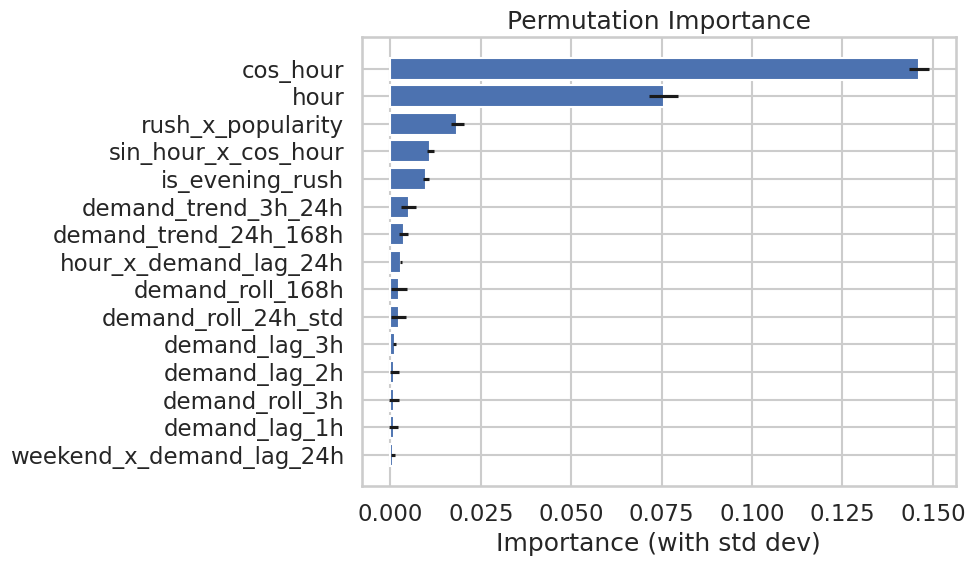

                 feature  correlation direction
       rush_x_popularity     0.298353  positive
         is_evening_rush     0.298318  positive
     evening_rush_x_hour     0.273796  positive
           is_late_night     0.263661  negative
                cos_hour     0.260763  negative
                sin_hour     0.209792  negative
                    hour     0.138659  positive
           demand_lag_1h     0.103702  positive
          demand_lag_24h     0.076246  negative
     sin_hour_x_cos_hour     0.058785  positive
           demand_lag_3h     0.056766  negative
            hour_squared     0.053322  positive
         is_morning_rush     0.051999  positive
              hour_x_dow     0.050371  positive
weekend_x_demand_lag_24h     0.046216  negative


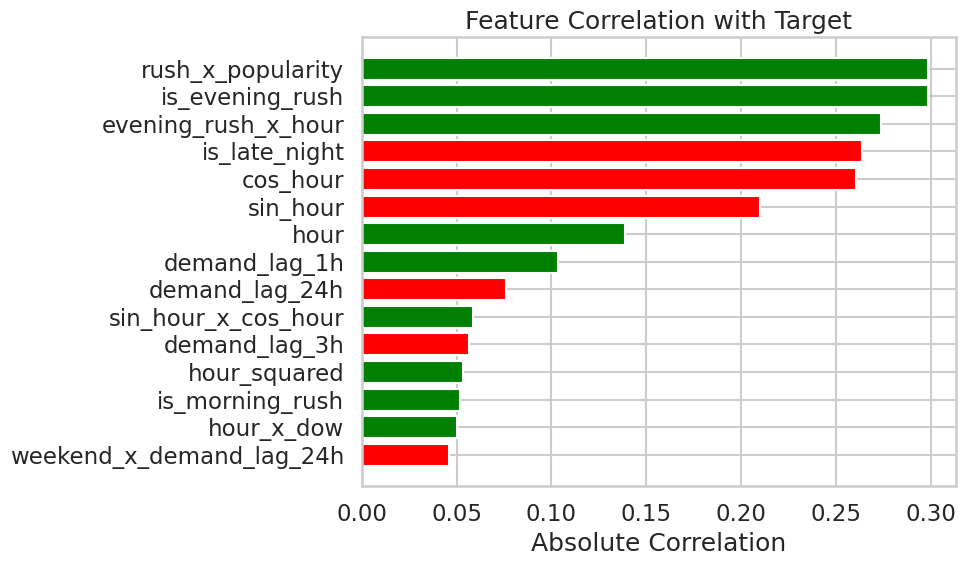


COMBINED RESULTS (Normalized, Top 15)
                          Permutation  Correlation  avg_importance
feature                                                           
cos_hour                        1.000        0.873           0.936
rush_x_popularity               0.143        1.000           0.572
is_evening_rush                 0.086        1.000           0.543
hour                            0.526        0.459           0.493
evening_rush_x_hour             0.020        0.917           0.468
is_late_night                   0.019        0.883           0.451
sin_hour                        0.015        0.700           0.358
demand_lag_1h                   0.025        0.341           0.183
sin_hour_x_cos_hour             0.093        0.189           0.141
demand_lag_24h                  0.014        0.248           0.131
demand_lag_3h                   0.027        0.182           0.104
demand_trend_3h_24h             0.052        0.140           0.096
hour_squared           

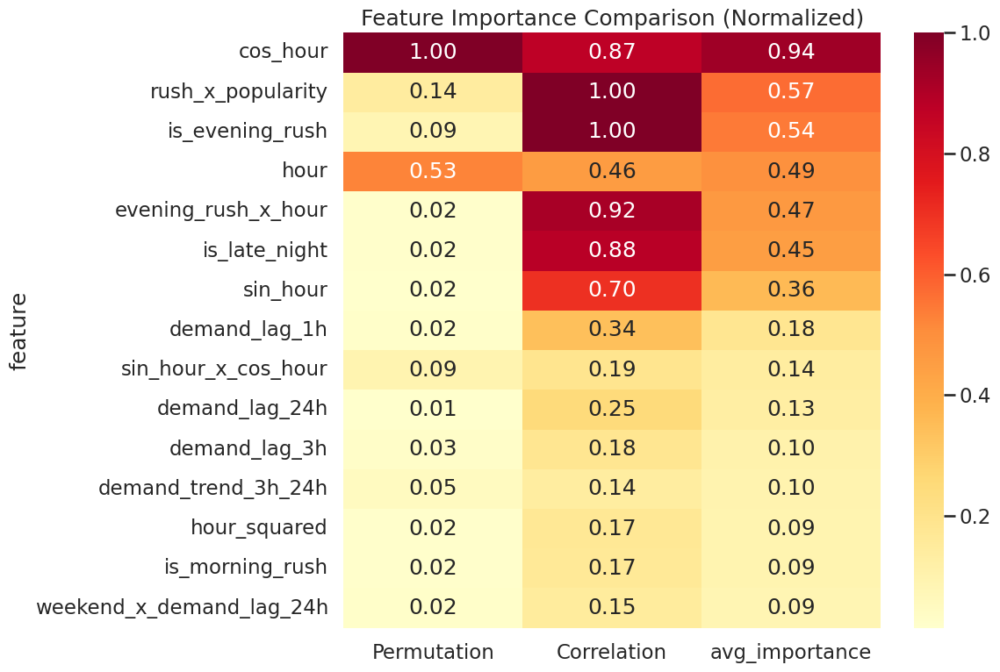

In [113]:
model, comparison = run_feature_importance(X, y)

In [714]:
%pip install pyarrow

Note: you may need to restart the kernel to use updated packages.


In [40]:
final_classification_encode= pd.read_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_encode_dropcols_v9.csv")
final_classification_encode.to_parquet("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_encode_dropcols_v9.parquet", engine='pyarrow', index=False)

In [ ]:
final_classification_no_encode= pd.read_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_no_encode_drop_cols_v8.csv")
final_classification_no_encode.to_parquet("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_no_encode_drop_cols_v8.parquet", engine='pyarrow', index=False)

## Resampling and Upsampling

In [41]:
df_v9 = pd.read_csv("/home/nsangph/data_sci_2025/Intro-To-ML-Proj/data/feature_eng_encode_dropcols_v9.csv")
df_v9.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 37 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Booking Status              150000 non-null  object 
 1   Avg VTAT                    150000 non-null  float64
 2   Avg CTAT                    150000 non-null  float64
 3   Driver Ratings              150000 non-null  float64
 4   Customer Rating             150000 non-null  float64
 5   hour                        150000 non-null  int64  
 6   day_of_week                 150000 non-null  int64  
 7   is_weekend                  150000 non-null  int64  
 8   month                       150000 non-null  int64  
 9   day                         150000 non-null  int64  
 10  hour_sin                    150000 non-null  float64
 11  hour_cos                    150000 non-null  float64
 12  dow_sin                     150000 non-null  float64
 13  dow_cos       